# Road Object Detection using Fine-Tuned Pre-Trained Neural Networks
**Advanced Intelligent Systems - Final Project**

*Group Members*
- Advincula, Andre Frederick
- Alvarez, Aaron Jetro
- Dee, Giann Wayne
- Gulinao, Lance Owen
- Laguna, Ivan Matthew
- Uy, Alec Matthew
- Verceles, Miguel Angelo




## Objectives

1. **Dataset Exploration and Understanding**  
   - Analyze the BDD100K dataset, focusing on object classes, distributions, and label properties, to assess its suitability for object detection tasks.

2. **Data Preprocessing and Preparation**  
   - Prepare images and annotations for YOLO by resizing, normalizing, and converting labels into YOLO-compatible formats to maximize model efficiency.

3. **Model Selection and Training**  
   - Fine-tune a YOLOv8 model (initially pre-trained on a generic dataset) for specific road object detection tasks, adjusting parameters like batch size, image size, and number of epochs to optimize performance on the BDD100K dataset.

4. **Evaluation and Analysis of Detection Performance**  
   - Evaluate the YOLO model’s object detection accuracy using metrics like mAP (mean Average Precision), precision, and recall, comparing pre- and post-fine-tuning results.

5. **Insights on YOLOv8 Fine-Tuning**  
   - Document findings on how fine-tuning parameters influence YOLO's ability to detect road objects, identifying challenges and potential improvements for future work.

6. **Comparison with Benchmark Models (if applicable)**  
   - Optionally, compare YOLO’s detection performance with other state-of-the-art models to contextualize results and highlight YOLO’s strengths and limitations.


# 1) Importing Libraries and data set

### Installing and Importing libraries for the modelling process

In [ ]:
!pip install -q tensorflow --disable-pip-version-check
!pip install -q numpy --disable-pip-version-check
!pip install -q pandas --disable-pip-version-check
!pip install -q matplotlib --disable-pip-version-check
!pip install -q pydot --disable-pip-version-check
!pip install -q opencv-python --disable-pip-version-check
!pip install -q tqdm --disable-pip-version-check
!pip install -q pytorch
!pip install -q kagglehub
!pip install -q ultralytics opencv-python-headless matplotlib bdd100k
%matplotlib inline

  Preparing metadata (setup.py) ... done
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for pytorch
ERROR: ERROR: Failed to build installable wheels for some pyproject.toml based projects (pytorch)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 896.9/896.9 kB 16.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.4/54.4 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 164.7/164.7 kB 14.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 161.5/161.5 kB 14.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 11.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.2/139.2 kB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 107.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━

In [3]:
# Add the directory to the Python path
import sys
sys.path.append('/content/')

# Import the modules
import metrictools as mt
import exploratorymethods as em
import bddtools as bt

# Reload the modules if needed
import importlib
importlib.reload(mt)
importlib.reload(em)
importlib.reload(bt)

from ultralytics import YOLO
import matplotlib.pyplot as plt
import kagglehub
from pathlib import Path
import seaborn as sns
from tqdm import tqdm
import cv2
import os
import json
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import importlib
%matplotlib inline
%load_ext tensorboard

### Downloading the dataset

In [6]:

# Download latest version of the dataset, if the download stops/faces an error, you can rerun and it will continue to download.
path = kagglehub.dataset_download("solesensei/solesensei_bdd100k")

print("Path to dataset files:", path)

Path to dataset files: /root/.cache/kagglehub/datasets/solesensei/solesensei_bdd100k/versions/2


### Specifying paths for easier access in the notebook

Before proceeding, make sure that you have a folder named "dataset". For easier access I recommmend that you put it in the same directory as where your notebook is located.

**Some notes**
 - For now, your labels will only have the .json files as it will be converted automatically using this notebook.
 - dataset.yaml must be created manually in the same folder where your notebook is located. A copy is provided in the repository as well

![File Structure](file%20structure.png)



In [7]:
# Paths to JSON annotation files and output label directories. Specify the path of the labels.json here
annotations_train_path = os.path.join(path,"bdd100k_labels_release","bdd100k","labels", "bdd100k_labels_images_train.json")
annotations_val_path = os.path.join(path, "bdd100k_labels_release","bdd100k","labels", "bdd100k_labels_images_val.json")
images_train_path = os.path.join(path, "bdd100k","bdd100k","images", "100k","train")
images_val_path = os.path.join(path, "bdd100k","bdd100k","images", "100k","val")
images_test_path = os.path.join(path, "bdd100k","bdd100k","images", "100k","test")
images_train_path10k = os.path.join(path, "bdd100k","bdd100k","images", "10k","train")
images_val_path10k = os.path.join(path, "bdd100k","bdd100k","images", "10k","val")
images_test_path10k = os.path.join(path, "bdd100k","bdd100k","images", "10k","test")

# Updated output directories for converted YOLO labels. this must point to the labels folder specified in the previous cell block.
output_labels_train_path = "dataset1/labels/train"
output_labels_val_path = "dataset1/labels/val"
image_width, image_height = 1280, 720

class_mapping = {
    "car": 0,
    "truck": 1,
    "bus": 2,
    "motor": 3,
    "bike": 4,
    "person": 5,
    "traffic light": 6,
    "traffic sign": 7,
    "train": 8,
    "rider": 9
}

In [8]:
# moving folders from the download folder to the notebook folder
bt.move_files(source_dir=images_train_path, destination_dir="dataset1/images/train")
bt.move_files(source_dir=images_val_path, destination_dir="dataset1/images/val")
bt.move_files(source_dir=images_test_path, destination_dir="dataset1/images/test")

No files or subdirectories to move. All are already in the destination.
No files or subdirectories to move. All are already in the destination.
No files or subdirectories to move. All are already in the destination.


# 2) Exploratory Data Analysis

### Preprocessing Data For EDA

In [9]:
# Converting BDD100k data labels to YOLO Format

bt.convert_annotations_to_yolo(
    annotations_train_path,
    annotations_val_path,
    output_labels_train_path,
    output_labels_val_path,
    image_width,
    image_height,
    class_mapping
)

Processing training annotations...
Processing validation annotations...
Conversion complete! YOLO labels are saved in the specified output directories.


In [ ]:
# Making a dataframe copy of YOLO labels for EDA

train_labels_df = bt.yolo_labels_to_dataframe(output_labels_train_path, image_width, image_height)
val_labels_df = bt.yolo_labels_to_dataframe(output_labels_val_path, image_width, image_height)

# Display the first few rows of the DataFrames
print("Train Labels:")
print(train_labels_df.head())
print("\nValidation Labels:")
print(val_labels_df.head())

Processing YOLO labels: 100%|██████████| 10000/10000 [00:00<00:00, 11937.44it/s]


Train Labels:
                filename  class_id    x_center    y_center  bbox_width  \
0  7a7a3a44-73522c9c.jpg         6  489.454651  169.677614   10.748808   
1  7a7a3a44-73522c9c.jpg         6  645.312369  168.142069    6.142177   
2  7a7a3a44-73522c9c.jpg         6  478.705845  168.142069    7.677719   
3  7a7a3a44-73522c9c.jpg         6  639.170191  167.374297    6.142177   
4  7a7a3a44-73522c9c.jpg         6  732.838376  204.995126   12.284352   

   bbox_height        area  aspect_ratio  
0    18.426529  198.063222      0.583333  
1    15.355440   94.315830      0.400000  
2    21.497618  165.052670      0.357143  
3    19.962073  122.610586      0.307692  
4    12.284352  150.905304      1.000000  

Validation Labels:
                filename  class_id    x_center    y_center  bbox_width  \
0  c3c0f47b-3d4e0313.jpg         7  800.348676  224.187125   36.058070   
1  c3c0f47b-3d4e0313.jpg         7  801.132546  246.919386   21.948389   
2  c3c0f47b-3d4e0313.jpg         7  809.7

### Data Metrics

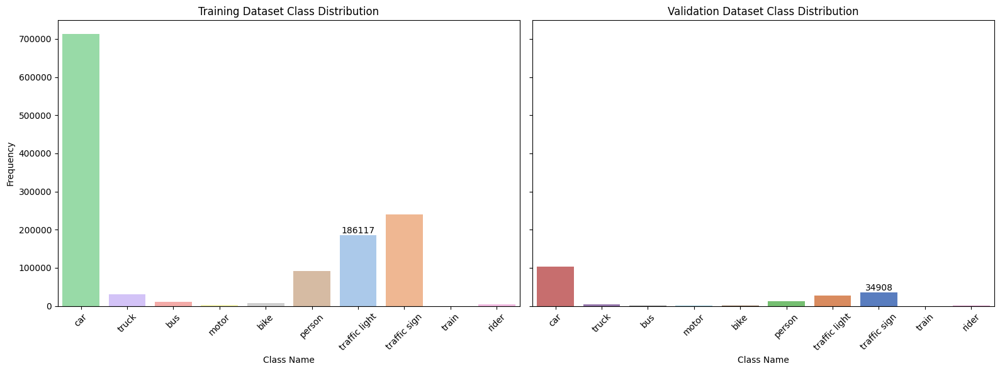


### Class Distribution Summary ###

Training Dataset:
class_name
car              713211
traffic sign     239686
traffic light    186117
person            91349
truck             29971
bus               11672
bike               7210
rider              4517
motor              3002
train               136

Validation Dataset:
class_name
car              102506
traffic sign      34908
traffic light     26885
person            13262
truck              4245
bus                1597
bike               1007
rider               649
motor               452
train                15


In [ ]:
em.plot_class_distribution(train_labels_df, val_labels_df, class_mapping)

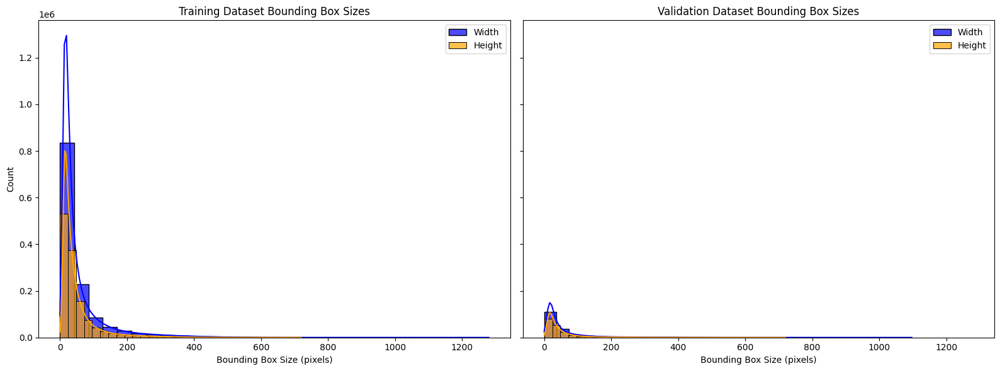

In [ ]:
em.plot_bbox_size_distribution(train_labels_df, val_labels_df)

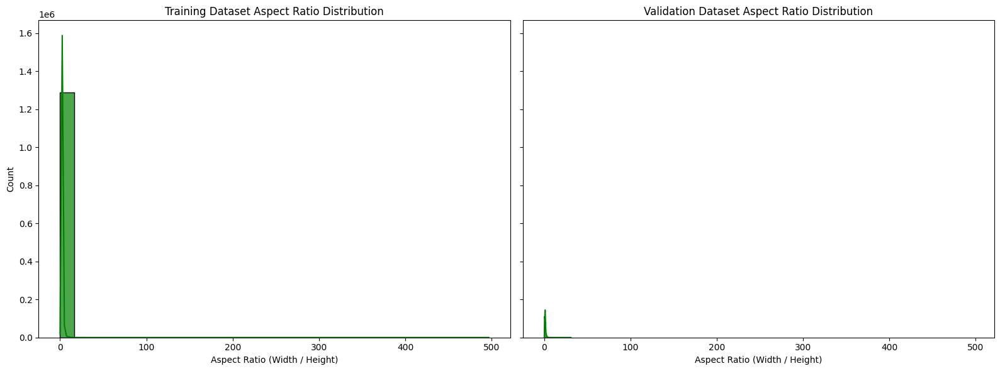

In [ ]:
em.plot_aspect_ratio_distribution(train_labels_df, val_labels_df)

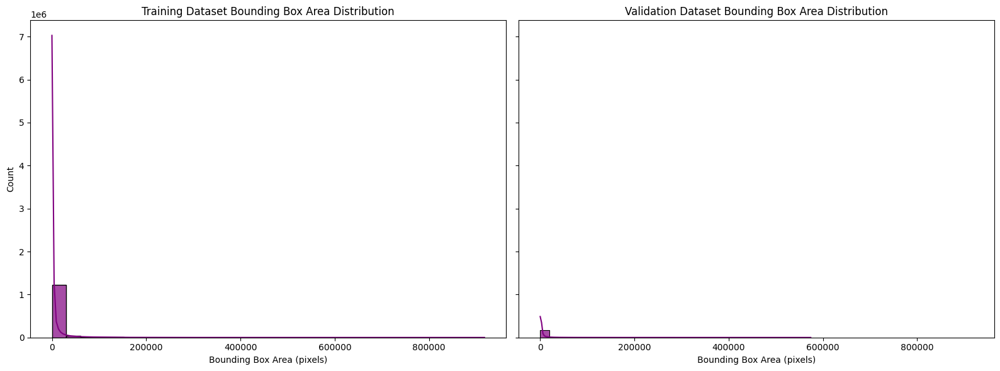

In [ ]:
em.plot_bbox_area_distribution(train_labels_df, val_labels_df)

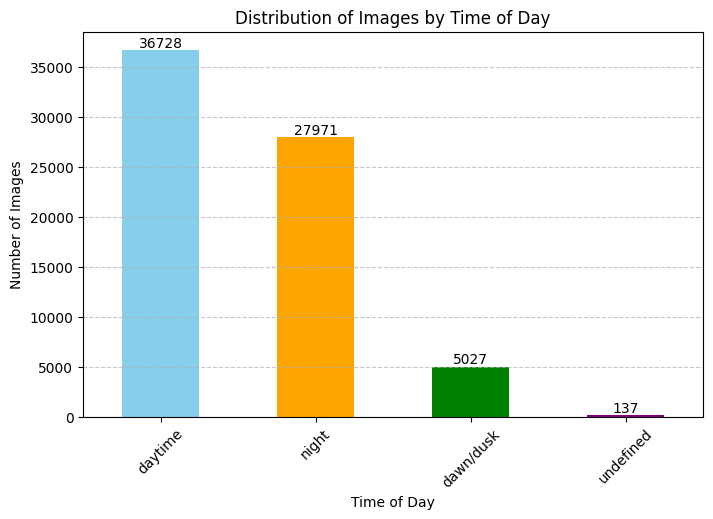

In [ ]:
em.analyze_time_of_day(annotations_train_path)

Scanning directory: dataset1/images/train
Scanning directory: dataset1/images/val
Scanning directory: dataset1/images/test


/content/exploratorymethods.py:227: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=format_df, x="Format", y="Count", palette="viridis")


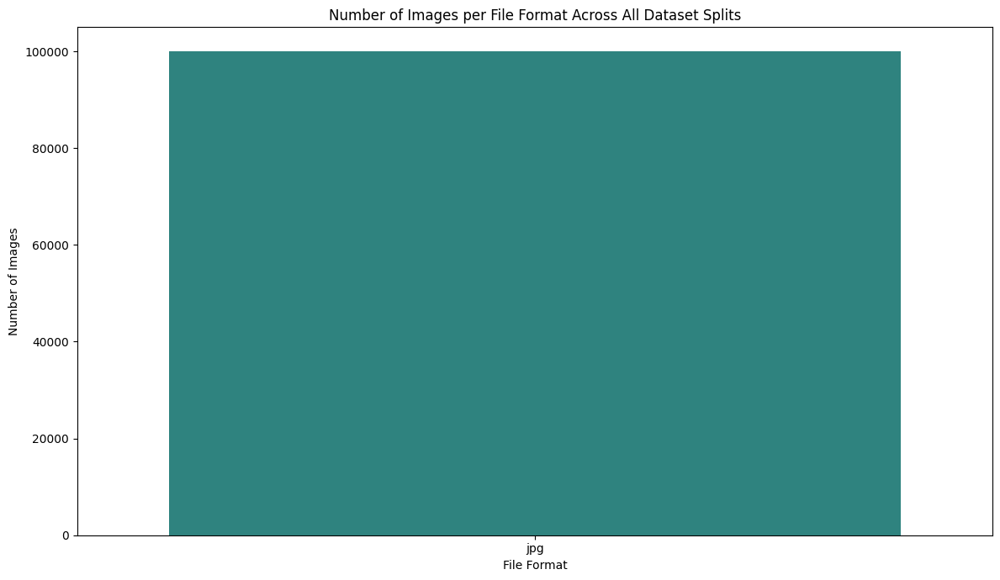

File Format Distribution Across All Dataset Splits:
Format  Count
   jpg 100000


In [ ]:
new_train_path = "dataset1/images/train"
new_val_path = "dataset1/images/val"
new_test_path = "dataset1/images/test"

em.check_file_format_distribution(new_train_path, new_val_path, new_test_path)

Dataset Image Inspection:
Total images in directory: 10000
Using seed: 60
Images to be displayed: 16


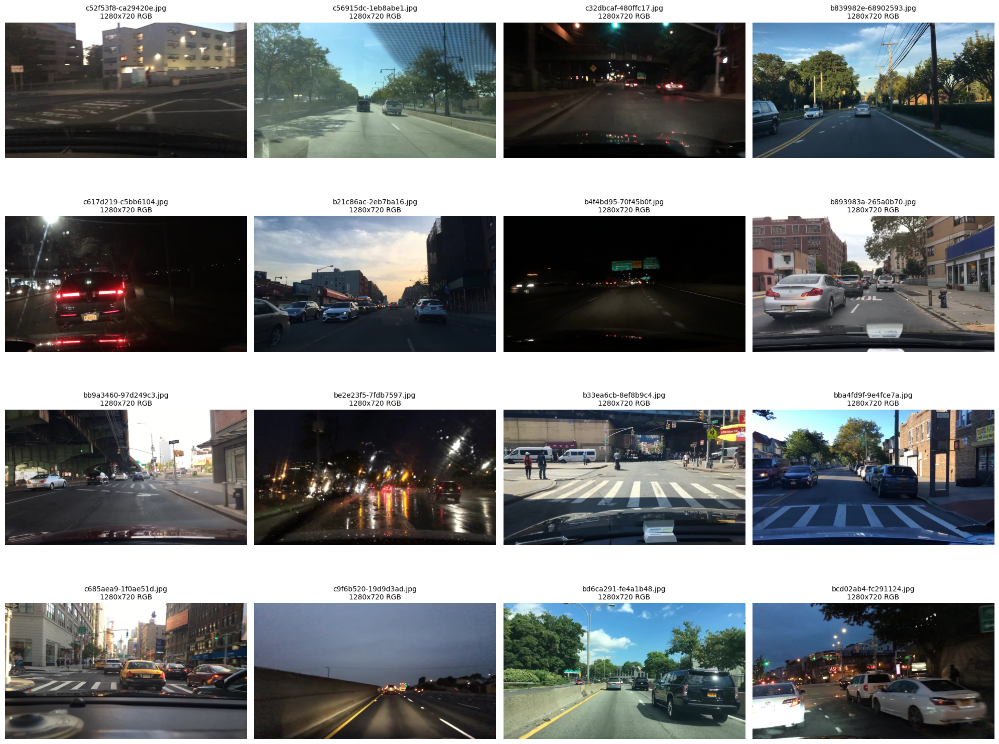

In [ ]:
em.display_image_grid("dataset1/images/val", num_images_to_show=16, num_cols=4, figsize_per_row=(20, 4), verbose=True, seed=60)

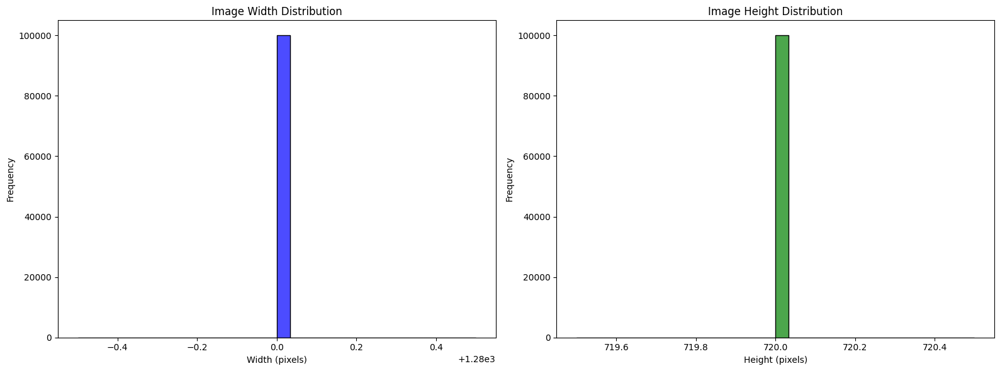

Image Resolution Statistics:
          Width    Height
count  100000.0  100000.0
mean     1280.0     720.0
std         0.0       0.0
min      1280.0     720.0
25%      1280.0     720.0
50%      1280.0     720.0
75%      1280.0     720.0
max      1280.0     720.0


In [ ]:
em.plot_image_resolution_distribution('dataset1/images')

In [ ]:
new_train_path = "dataset1/images/train"
new_val_path = "dataset1/images/val"
new_test_path = "dataset1/images/test"

brightness_values, contrast_values = em.brightness_and_contrast_analysis(new_train_path, new_val_path, new_test_path)

Brightness Analysis:
count    100000.000000
mean         73.551763
std          39.222089
min           0.115639
25%          32.866457
50%          85.570990
75%         105.198554
max         250.037918
dtype: float64

Contrast Analysis:
count    100000.000000
mean         49.886393
std          17.110216
min           2.169516
25%          35.212967
50%          54.869272
75%          63.346242
max          93.864011
dtype: float64


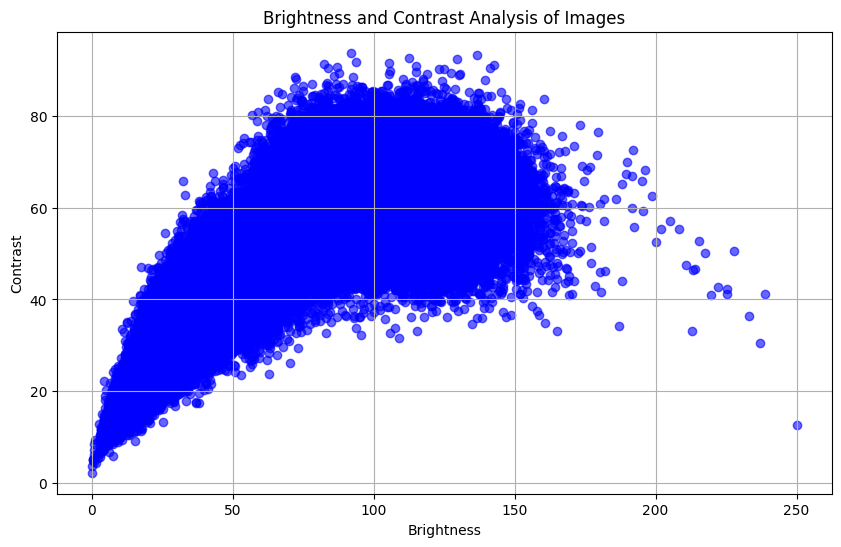

In [ ]:
em.plot_brightness_contrast(brightness_values, contrast_values)

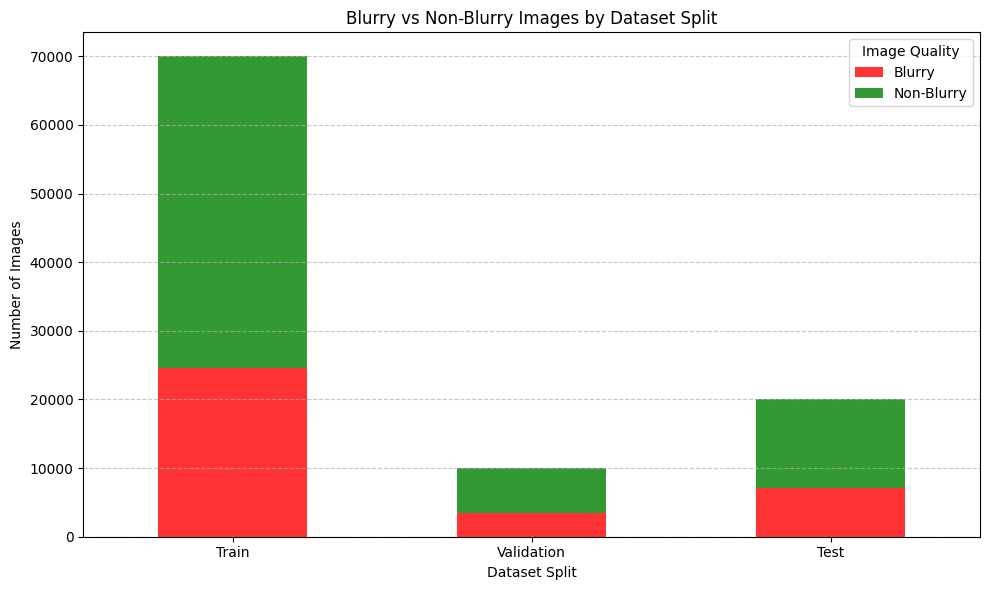

Summary of Blurry Images:
   Dataset  Blurry  Non-Blurry
     Train   24588       45412
Validation    3451        6549
      Test    7137       12863


In [ ]:
em.detect_blurry_images(new_train_path, new_val_path, new_test_path, threshold=100.0)

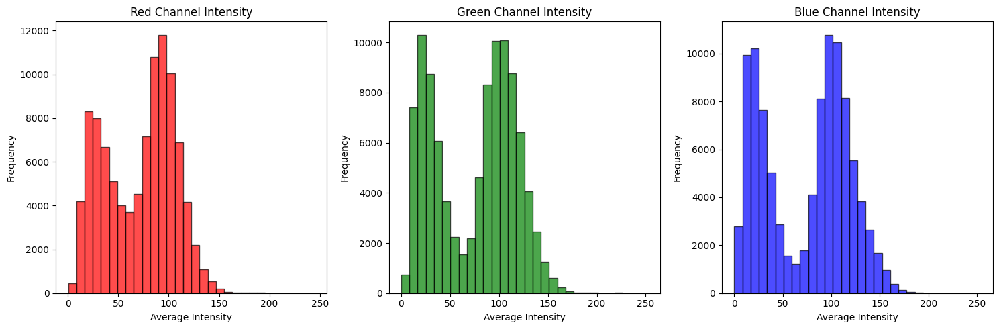

Average Red Intensity: 71.10673987063802
Average Green Intensity: 74.68870000746527
Average Blue Intensity: 74.00394385130208


In [ ]:
em.color_analysis("dataset1/images")

### Checking If data has been properly imported and processed by making an inference using Yolo Models

#### YOLO V8

100%|██████████| 6.25M/6.25M [00:00<00:00, 335MB/s]



image 1/1 /content/dataset1/images/val/b1c66a42-6f7d68ca.jpg: 384x640 12 cars, 1 truck, 53.6ms
Speed: 14.1ms preprocess, 53.6ms inference, 799.6ms postprocess per image at shape (1, 3, 384, 640)


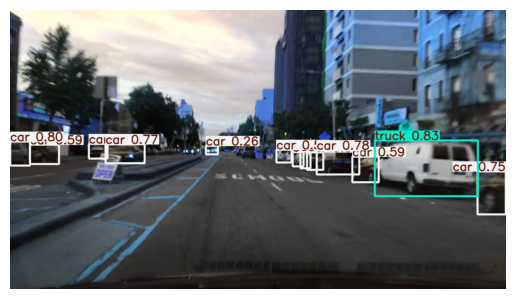

In [ ]:

# Load a pre-trained YOLOv8 model (choose from "yolov8n.pt", "yolov8s.pt", "yolov8m.pt", "yolov8l.pt", "yolov8x.pt" based on your requirements)
model = YOLO("yolov8n.pt")  # "yolov8n.pt" is the nano model, which is fastest but least accurate

# Run inference on an image (replace with your image path)
results = model("dataset1/images/val/b1c66a42-6f7d68ca.jpg")

# Display results
for result in results:
    boxes = result.boxes
    plt.imshow(result.plot())
    plt.axis("off")
    plt.show()


#### YOLO V5

100%|██████████| 17.7M/17.7M [00:00<00:00, 392MB/s]



image 1/1 /content/dataset1/images/val/b1c66a42-6f7d68ca.jpg: 384x640 13 cars, 1 truck, 39.0ms
Speed: 1.7ms preprocess, 39.0ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


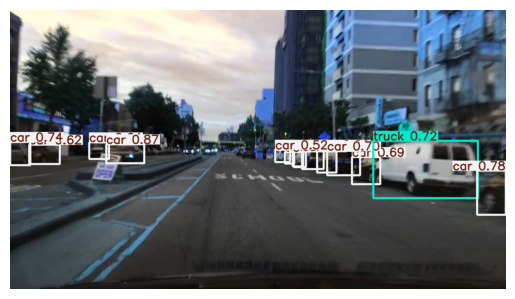

In [ ]:
from ultralytics import YOLO

# Load the pre-trained YOLOv5 model
model = YOLO("yolov5su.pt")  # replace with your desired model size

# Perform inference on a single image
results = model("dataset1/images/val/b1c66a42-6f7d68ca.jpg")

# Display results
for result in results:
    boxes = result.boxes
    plt.imshow(result.plot())
    plt.axis("off")
    plt.show()



# 3) Model Implementation and Fine-tuning

## Dataset Preparation

This part will automate the creation of the .yaml files and the creation of the needed folders along with the proper structure. Our experiments will involve using 4 variations of the data set.

1) <b>Dataset 1</b>: Original dataset with 100k images. 70k for training, 10k for validation, and 20k for testing.
2) <b>Dataset 2</b>: Mid sized dataset with 10k images, 7k for training, 2k for validation, and 1k for testing.
3) <b>Dataset 3</b>: Small sized dataset with 1.5k images (random sampling), 1k for training, 500 for validation. (testing is taken from the larger datasets)
4) <b>Dataset 4</b>: Small sized dataset with 1.5k images (stratified sampling). Same structure as dataset 3.
5) <b>Dataset 5</b>: Original dataset with Oversampling to handle class imbalance

In [ ]:
# FOR DATASET1

#moving images from subfolders to the main folders to follow YOLO's folder structure
bt.flatten_folders(source_dir="dataset1/images/train", destination_dir="dataset1/images/train")
bt.flatten_folders(source_dir="dataset1/images/val", destination_dir="dataset1/images/val")
bt.flatten_folders(source_dir="dataset1/images/test", destination_dir="dataset1/images/test")

Flattening folders: 100%|██████████| 70000/70000 [00:01<00:00, 38472.54it/s]


Moved 70000 files from 'dataset1/images/train' to 'dataset1/images/train'.


Flattening folders: 100%|██████████| 10000/10000 [00:00<00:00, 119716.17it/s]


Moved 10000 files from 'dataset1/images/val' to 'dataset1/images/val'.


Flattening folders: 100%|██████████| 20000/20000 [00:00<00:00, 39223.63it/s]

Moved 20000 files from 'dataset1/images/test' to 'dataset1/images/test'.


In [ ]:
# FOR DATASET2
# moving folders from the download folder to the notebook folder
bt.copy_files(source_dir="dataset1/images/train", items = 7000,destination_dir="dataset2/images/train")
bt.copy_files(source_dir="dataset1/images/val", items = 2000,destination_dir="dataset2/images/val")
bt.copy_files(source_dir="dataset1/images/test", items = 1000, destination_dir="dataset2/images/test")
bt.convert_annotations_to_yolo(annotations_train_path, annotations_val_path, "dataset2/labels/train",
                               "dataset2/labels/val", image_width, image_height, class_mapping)

Copying files: 100%|██████████| 7000/7000 [00:00<00:00, 7198.45it/s]


Copying complete. Skipped 0 files due to existing duplicates.
Copied 7000 new files to 'dataset2/images/train'.


Copying files: 100%|██████████| 2000/2000 [00:00<00:00, 7160.74it/s]


Copying complete. Skipped 0 files due to existing duplicates.
Copied 2000 new files to 'dataset2/images/val'.


Copying files: 100%|██████████| 1000/1000 [00:00<00:00, 7290.61it/s]


Copying complete. Skipped 0 files due to existing duplicates.
Copied 1000 new files to 'dataset2/images/test'.
Processing training annotations...
Processing validation annotations...
Conversion complete! YOLO labels are saved in the specified output directories.


In [ ]:
# For Dataset 3
bt.copy_files(source_dir="dataset1/images/train",items=1000,destination_dir="dataset3/images/train")
bt.copy_files(source_dir="dataset1/images/val",items=500,destination_dir="dataset3/images/val")
bt.convert_annotations_to_yolo(annotations_train_path, annotations_val_path, "dataset3/labels/train",
                               "dataset3/labels/val", image_width, image_height, class_mapping)

Copying files: 100%|██████████| 1000/1000 [00:00<00:00, 7235.11it/s]


Copying complete. Skipped 0 files due to existing duplicates.
Copied 1000 new files to 'dataset3/images/train'.


Copying files: 100%|██████████| 500/500 [00:00<00:00, 7223.96it/s]


Copying complete. Skipped 0 files due to existing duplicates.
Copied 500 new files to 'dataset3/images/val'.
Processing training annotations...
Processing validation annotations...
Conversion complete! YOLO labels are saved in the specified output directories.


In [ ]:
#For Dataset 4

bt.convert_annotations_to_yolo(annotations_train_path, annotations_val_path, "dataset4/labels/train",
                               "dataset4/labels/val", image_width, image_height, class_mapping)
bt.copy_files(source_dir="dataset1/images/train",pick = "picked_train.json",destination_dir="dataset4/images/train")
bt.copy_files(source_dir="dataset1/images/val",pick = "picked_val.json",destination_dir="dataset4/images/val")

Processing training annotations...
Processing validation annotations...
Conversion complete! YOLO labels are saved in the specified output directories.


Copying files: 100%|██████████| 1000/1000 [00:00<00:00, 6819.37it/s]


Copying complete. Skipped 0 files due to existing duplicates.
Copied 1000 new files to 'dataset4/images/train'.


Copying files: 100%|██████████| 500/500 [00:00<00:00, 6433.61it/s]

Copying complete. Skipped 0 files due to existing duplicates.
Copied 500 new files to 'dataset4/images/val'.


In [ ]:
# Creating the .YAML FILES
# Base path where datasets are located
base_path = os.path.abspath(".")
# Output directory for YAML files
output_yaml_dir = "yaml_files"
# Create YAML files for all datasets
for dataset in ["dataset1", "dataset2", "dataset3", "dataset4","dataset5"]:
    bt.create_dataset_yaml(dataset, base_path, output_yaml_dir, class_mapping)


YAML file created at: yaml_files/dataset1.yaml
YAML file created at: yaml_files/dataset2.yaml
YAML file created at: yaml_files/dataset3.yaml
YAML file created at: yaml_files/dataset4.yaml
YAML file created at: yaml_files/dataset5.yaml


## Data Preprocessing

Applying additional preprocessing to handle class imbalance

In [ ]:

import os
import random
import shutil
import math
from PIL import Image
import torchvision.transforms as transforms

# Paths
dataset4_path = "dataset4"
dataset5_path = "dataset5"

# Helper functions
def parse_yolo_label(label_path):
    labels = []
    with open(label_path, "r") as file:
        for line in file:
            parts = line.strip().split()
            class_id = int(parts[0])
            bbox = list(map(float, parts[1:]))
            labels.append([class_id, *bbox])
    return labels

def save_yolo_label(label_path, labels):
    with open(label_path, "w") as file:
        for label in labels:
            class_id, x, y, w, h = label
            file.write(f"{class_id} {x} {y} {w} {h}\n")

# Adjust bounding boxes for rotation
def adjust_labels_for_rotation(labels, angle, image_width, image_height):
    angle_rad = math.radians(angle)
    center_x = 0.5  # Image center in normalized coordinates
    center_y = 0.5

    adjusted_labels = []
    for label in labels:
        class_id, x, y, w, h = label
        x -= 0.5  # Shift to origin
        y -= 0.5

        # Apply rotation transformation
        new_x = x * math.cos(angle_rad) - y * math.sin(angle_rad)
        new_y = x * math.sin(angle_rad) + y * math.cos(angle_rad)

        new_x += 0.5  # Shift back to image space
        new_y += 0.5

        # Ensure bounding box remains within valid range
        new_x = max(0, min(new_x, 1))
        new_y = max(0, min(new_y, 1))

        adjusted_labels.append([class_id, new_x, new_y, w, h])  # Width and height remain unaffected

    return adjusted_labels

# Adjust bounding boxes for horizontal flip
def adjust_labels_for_flip(labels, image_width):
    adjusted_labels = []
    for label in labels:
        class_id, x, y, w, h = label
        new_x = 1 - x  # Mirror the x-coordinate
        adjusted_labels.append([class_id, new_x, y, w, h])

    return adjusted_labels

# Augment images with class 8 or 9
def augment_images(image_list, split_name):
    src_image_folder = os.path.join(dataset5_path, f"images/{split_name}")
    src_label_folder = os.path.join(dataset5_path, f"labels/{split_name}")

    for image_name in image_list:
        original_image_path = os.path.join(src_image_folder, image_name)
        original_label_path = os.path.join(src_label_folder, image_name.replace(".jpg", ".txt"))

        # Load original image and label
        image = Image.open(original_image_path).convert("RGB")
        original_labels = parse_yolo_label(original_label_path)
        image_width, image_height = image.size

        # Create 3 augmented copies
        for i in range(1, 4):
            # Apply augmentation
            augmented_image = image.copy()
            transform_name = ""
            if i == 1:  # Apply rotation
                angle = random.uniform(-10, 10)
                augmented_image = transforms.functional.rotate(augmented_image, angle)
                transform_name = f"_A{i}_rot"
                updated_labels = adjust_labels_for_rotation(
                    original_labels, angle, image_width, image_height
                )
            elif i == 2:  # Apply horizontal flip
                augmented_image = transforms.functional.hflip(augmented_image)
                transform_name = f"_A{i}_flip"
                updated_labels = adjust_labels_for_flip(original_labels, image_width)
            elif i == 3:  # Apply both
                angle = random.uniform(-10, 10)
                augmented_image = transforms.functional.rotate(augmented_image, angle)
                updated_labels = adjust_labels_for_rotation(original_labels, angle, image_width, image_height)
                augmented_image = transforms.functional.hflip(augmented_image)
                updated_labels = adjust_labels_for_flip(updated_labels, image_width)

            # Save augmented image
            augmented_image_name = image_name.replace(".jpg", f"{transform_name}.jpg")
            augmented_image_path = os.path.join(src_image_folder, augmented_image_name)
            augmented_image.save(augmented_image_path)

            # Save augmented label
            augmented_label_name = image_name.replace(".jpg", f"{transform_name}.txt")
            augmented_label_path = os.path.join(src_label_folder, augmented_label_name)
            save_yolo_label(augmented_label_path, updated_labels)

def process_split(image_list, split_name):
    src_image_folder = os.path.join(dataset4_path, f"images/{split_name}")
    src_label_folder = os.path.join(dataset4_path, f"labels/{split_name}")
    dst_image_folder = os.path.join(dataset5_path, f"images/{split_name}")
    dst_label_folder = os.path.join(dataset5_path, f"labels/{split_name}")

    os.makedirs(dst_image_folder, exist_ok=True)
    os.makedirs(dst_label_folder, exist_ok=True)

    filtered_images = []

    for image_name in image_list:
        # Paths for the current image and label
        src_image_path = os.path.join(src_image_folder, image_name)
        src_label_path = os.path.join(src_label_folder, image_name.replace(".jpg", ".txt"))
        dst_image_path = os.path.join(dst_image_folder, image_name)
        dst_label_path = os.path.join(dst_label_folder, image_name.replace(".jpg", ".txt"))

        # Copy image
        if os.path.exists(src_image_path):
            shutil.copy(src_image_path, dst_image_path)
        else:
            print(f"Warning: Image {src_image_path} not found.")
            continue

        # Copy label if it exists
        if os.path.exists(src_label_path):
            shutil.copy(src_label_path, dst_label_path)

            # Check for classes 8 and 9 in the label
            labels = parse_yolo_label(src_label_path)
            if any(label[0] in {3,4,5,6,7,8, 9} for label in labels):
                filtered_images.append(image_name)
        else:
            print(f"Warning: Label {src_label_path} not found.")

    return filtered_images

import json

# Load picked_train.json
with open("picked_train.json", "r") as train_file:
    train_images = json.load(train_file)  # Assuming it contains a list of file names

# Load picked_val.json
with open("picked_val.json", "r") as val_file:
    val_images = json.load(val_file)  # Assuming it contains a list of file names

# Process train split
train_images_with_class_8_9 = process_split(train_images, "train")
augment_images(train_images_with_class_8_9, "train")

# Process validation split
val_images_with_class_8_9 = process_split(val_images, "val")
augment_images(val_images_with_class_8_9, "val")



In [10]:
paths = bt.set_paths()
dataset1_path = paths["dataset1_path"]
dataset2_path = paths["dataset2_path"]
dataset3_path = paths["dataset3_path"]
dataset4_path = paths["dataset4_path"]
dataset5_path = paths["dataset5_path"]
project_path = paths["project_path"]


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dataset 1 path: /content/yaml_files/dataset1.yaml
Dataset 2 path: /content/yaml_files/dataset2.yaml
Dataset 3 path: /content/yaml_files/dataset3.yaml
Dataset 4 path: /content/yaml_files/dataset4.yaml
Dataset 5 path: /content/yaml_files/dataset5.yaml
Project path: /content/drive/MyDrive/FinalProjectRuntimeruns/train


## Base Model

This part establishes the benchmark model that will be used for the entire experiment. The dataset used for this is the mid-sized dataset. It allows us to gain a feel of the performance of the dataset, without heavy processing.

### Pre-Trained YOLO model without Fine-Tuning

In [ ]:
from ultralytics import YOLO

# Load a pre-trained YOLOv8 model (e.g., yolov8n.pt, yolov8s.pt, etc.)
model1 = YOLO("yolov8n.pt")  # You can choose different versions depending on the speed and accuracy you need

# Train the model with the updated syntax
model1.train(
    data=dataset2_path,  # Path to your custom dataset.yaml file
    epochs=5,            # Number of training epochs
    imgsz=640,            # Image size (YOLO generally works well with 640 or 1280)
    batch=32,              # Set batch size (e.g., 8) to control memory usage
    project= project_path, # Directory where training results will be saved
    name="model_1", # Folder name for saving the model
    exist_ok=True         # Overwrite existing run folder
)


Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/yaml_files/dataset2.yaml, epochs=5, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/FinalProjectRuntimeruns/train, name=model_1, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=

train: Scanning /content/dataset2/labels/train.cache... 6989 images, 11 backgrounds, 0 corrupt: 100%|██████████| 7000/7000 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/dataset2/labels/val.cache... 2000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2000/2000 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_1/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_1
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      7.26G      1.648       2.03      1.091        924        640: 100%|██████████| 219/219 [00:33<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.98it/s]


                   all       2000      37036      0.652      0.164      0.164     0.0884

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      9.25G      1.524       1.25      1.055        749        640: 100%|██████████| 219/219 [00:31<00:00,  6.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.08it/s]


                   all       2000      37036      0.515       0.21      0.222      0.121

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      7.18G      1.499      1.154      1.045        571        640: 100%|██████████| 219/219 [00:30<00:00,  7.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.10it/s]


                   all       2000      37036      0.451      0.252      0.236      0.125

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      7.04G      1.463      1.086      1.034        837        640: 100%|██████████| 219/219 [00:30<00:00,  7.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.01it/s]


                   all       2000      37036      0.404      0.259      0.257      0.138

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      8.24G      1.431      1.034       1.02        839        640: 100%|██████████| 219/219 [00:30<00:00,  7.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.09it/s]


                   all       2000      37036      0.438      0.284      0.282      0.153

5 epochs completed in 0.057 hours.
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_1/weights/last.pt, 6.2MB
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_1/weights/best.pt, 6.2MB

Validating /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_1/weights/best.pt...
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 3,007,598 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:13<00:00,  2.36it/s]


                   all       2000      37036      0.427      0.283      0.282      0.154
                   car       1971      20799      0.572      0.625      0.634      0.379
                 truck        527        803      0.448       0.41      0.392      0.272
                   bus        245        317      0.386      0.353      0.319      0.243
                 motor         68         89        0.3     0.0112     0.0619     0.0296
                  bike         99        204      0.551      0.176      0.207     0.0829
                person        618       2449      0.494      0.399      0.398      0.179
         traffic light       1112       5261       0.43      0.323      0.284     0.0945
          traffic sign       1618       6990      0.416      0.395      0.355      0.172
                 train          4          5          0          0          0          0
                 rider         95        119      0.678      0.142      0.169     0.0854
Speed: 0.1ms preproce

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c19fb48d870>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0


image 1/1 /content/dataset1/images/val/b1c66a42-6f7d68ca.jpg: 384x640 18 cars, 2 traffic signs, 10.5ms
Speed: 1.7ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


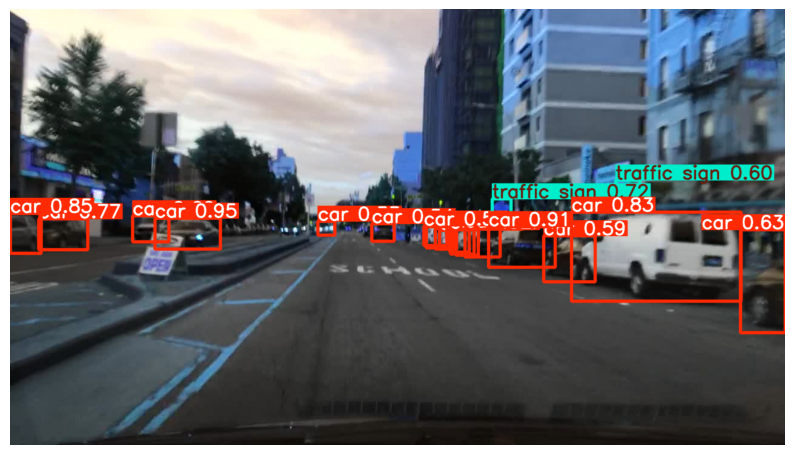

In [ ]:
#Test prediction
# Load the model
model1 = YOLO(f"{project_path}/model_1/weights/best.pt")
# Run inference on a test image
results = model1("dataset1/images/val/b1c66a42-6f7d68ca.jpg")

mt.display_results(results)

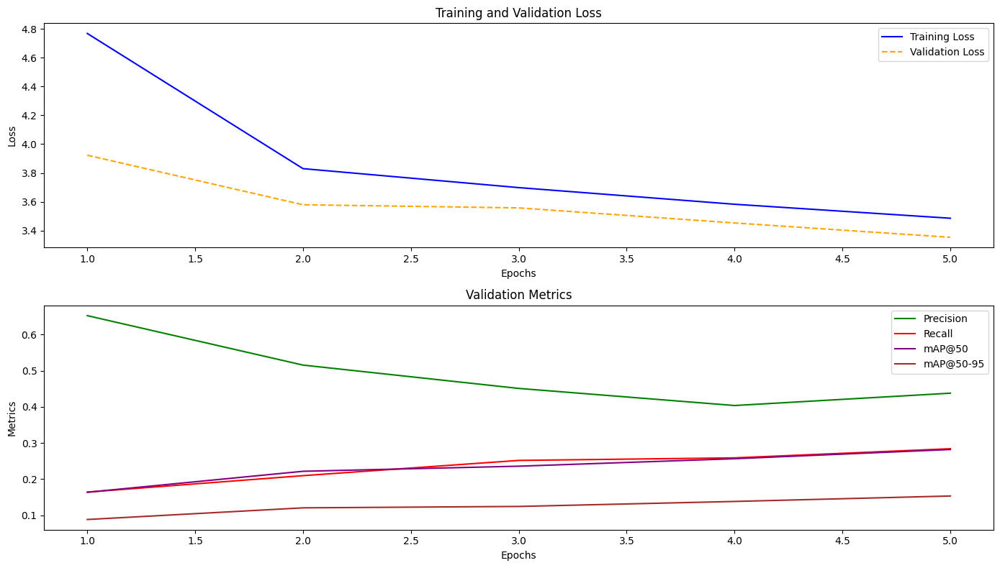

In [ ]:
mt.plot_yolo_metrics(f"{project_path}/model_1/results.csv")

## Experimental Models

### Pre-trained YOLO Model with Lower Batch SIZE

In [ ]:
from ultralytics import YOLO

# Load a pre-trained YOLOv8 model (e.g., yolov8n.pt, yolov8s.pt, etc.)
model2 = YOLO("yolov8n.pt")  # You can choose different versions depending on the speed and accuracy you need

# Train the model with the updated syntax
model2.train(
    data=dataset2_path,  # Path to your custom dataset.yaml file
    epochs=5,            # Number of training epochs
    imgsz=640,            # Image size (YOLO generally works well with 640 or 1280)
    batch=16,              # Set batch size (e.g., 8) to control memory usage
    project=project_path, # Directory where training results will be saved
    name="model_2", # Folder name for saving the model
    exist_ok=True         # Overwrite existing run folder
)


Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/yaml_files/dataset2.yaml, epochs=5, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/FinalProjectRuntimeruns/train, name=model_2, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=

train: Scanning /content/dataset2/labels/train.cache... 6989 images, 11 backgrounds, 0 corrupt: 100%|██████████| 7000/7000 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/dataset2/labels/val.cache... 2000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2000/2000 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_2
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      4.31G      1.633       1.86      1.092        241        640: 100%|██████████| 438/438 [00:48<00:00,  9.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:09<00:00,  6.81it/s]


                   all       2000      37036      0.536      0.199      0.186      0.103

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      3.93G      1.531      1.244      1.061        237        640: 100%|██████████| 438/438 [00:45<00:00,  9.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:09<00:00,  6.97it/s]


                   all       2000      37036        0.5      0.228      0.223       0.12

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      4.07G      1.504       1.15      1.049        229        640: 100%|██████████| 438/438 [00:43<00:00, 10.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:08<00:00,  7.28it/s]


                   all       2000      37036      0.376      0.251      0.249      0.134

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      3.56G      1.469      1.082      1.037        309        640: 100%|██████████| 438/438 [00:43<00:00, 10.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:08<00:00,  7.15it/s]


                   all       2000      37036      0.376      0.277      0.271      0.147

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      3.21G      1.428      1.021      1.022        181        640: 100%|██████████| 438/438 [00:44<00:00,  9.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:09<00:00,  6.92it/s]


                   all       2000      37036       0.42      0.288       0.29      0.158

5 epochs completed in 0.100 hours.
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_2/weights/last.pt, 6.2MB
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_2/weights/best.pt, 6.2MB

Validating /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_2/weights/best.pt...
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 3,007,598 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:14<00:00,  4.47it/s]


                   all       2000      37036      0.418      0.289       0.29      0.158
                   car       1971      20799      0.544       0.64      0.634      0.382
                 truck        527        803      0.518      0.386      0.407      0.283
                   bus        245        317      0.364      0.351      0.306      0.242
                 motor         68         89       0.33     0.0674     0.0771     0.0402
                  bike         99        204      0.382       0.23      0.241     0.0932
                person        618       2449      0.494      0.396      0.393      0.181
         traffic light       1112       5261      0.482      0.296      0.288     0.0956
          traffic sign       1618       6990      0.554      0.331       0.36      0.176
                 train          4          5          0          0          0          0
                 rider         95        119      0.518      0.193      0.194     0.0869
Speed: 0.1ms preproce

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c1a150fc190>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0


image 1/1 /content/dataset1/images/val/b1c66a42-6f7d68ca.jpg: 384x640 21 cars, 3 traffic signs, 10.3ms
Speed: 1.9ms preprocess, 10.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


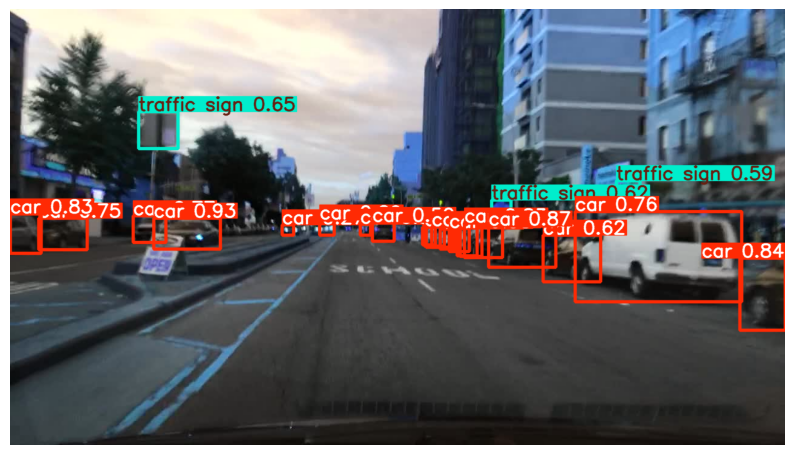

In [ ]:
# Load the fine-tuned model
model_2 = YOLO(f"{project_path}/model_2/weights/best.pt")


# Run inference on a test image
results = model_2("dataset1/images/val/b1c66a42-6f7d68ca.jpg")

mt.display_results(results)



### Increasing Epoch Size from 5 to 10

In [ ]:
from ultralytics import YOLO

# Load a pre-trained YOLOv8 model (e.g., yolov8n.pt, yolov8s.pt, etc.) this time we're using the learned weights from the first model
model3 = YOLO(f"{project_path}/model_1/weights/best.pt")  # You can choose different versions depending on the speed and accuracy you need


# Train the model with the updated syntax
model3.train(
    data=dataset2_path,  # Path to your custom dataset.yaml file
    epochs=10,            # Number of training epochs
    imgsz=640,            # Image size (YOLO generally works well with 640 or 1280)
    batch=32,              # Set batch size (e.g., 8) to control memory usage
    project=project_path, # Directory where training results will be saved
    name="model_3", # Folder name for saving the model
    exist_ok=True         # Overwrite existing run folder
)


Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/FinalProjectRuntimeruns/train/model_1/weights/best.pt, data=/content/yaml_files/dataset2.yaml, epochs=10, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/FinalProjectRuntimeruns/train, name=model_3, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, em

train: Scanning /content/dataset2/labels/train.cache... 6989 images, 11 backgrounds, 0 corrupt: 100%|██████████| 7000/7000 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/dataset2/labels/val.cache... 2000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2000/2000 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_3
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      5.33G      1.464      1.059      1.024        386        640: 100%|██████████| 219/219 [00:33<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.88it/s]


                   all       2000      37036      0.388       0.25      0.248      0.134

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      5.18G      1.499      1.069       1.04        455        640: 100%|██████████| 219/219 [00:30<00:00,  7.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.02it/s]


                   all       2000      37036      0.377      0.279      0.259      0.137

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      5.43G      1.507      1.061      1.042        391        640: 100%|██████████| 219/219 [00:29<00:00,  7.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.83it/s]


                   all       2000      37036      0.498      0.255      0.254      0.133

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      4.93G      1.498      1.038      1.041        382        640: 100%|██████████| 219/219 [00:29<00:00,  7.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.85it/s]


                   all       2000      37036      0.507      0.253      0.252      0.131

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      5.44G      1.485      1.011      1.038        437        640: 100%|██████████| 219/219 [00:29<00:00,  7.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.94it/s]


                   all       2000      37036      0.507      0.275      0.262      0.142

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      5.01G      1.464      0.974      1.028        454        640: 100%|██████████| 219/219 [00:28<00:00,  7.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.00it/s]


                   all       2000      37036      0.484      0.291      0.281      0.152

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      5.12G      1.448     0.9534      1.022        443        640: 100%|██████████| 219/219 [00:29<00:00,  7.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.95it/s]


                   all       2000      37036      0.528      0.292      0.292      0.156

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      5.01G      1.425     0.9241      1.014        438        640: 100%|██████████| 219/219 [00:29<00:00,  7.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.82it/s]


                   all       2000      37036      0.514      0.306      0.303      0.165

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      5.08G      1.411      0.904      1.008        371        640: 100%|██████████| 219/219 [00:28<00:00,  7.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.99it/s]


                   all       2000      37036      0.529      0.307      0.308      0.168

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      4.92G      1.394     0.8826      1.002        431        640: 100%|██████████| 219/219 [00:29<00:00,  7.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.07it/s]


                   all       2000      37036      0.532      0.315      0.318      0.176

10 epochs completed in 0.121 hours.
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_3/weights/last.pt, 6.2MB
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_3/weights/best.pt, 6.2MB

Validating /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_3/weights/best.pt...
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 3,007,598 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:13<00:00,  2.30it/s]


                   all       2000      37036      0.531      0.315      0.318      0.176
                   car       1971      20799      0.619      0.635      0.659      0.397
                 truck        527        803      0.422       0.46      0.434      0.309
                   bus        245        317      0.388      0.388      0.378      0.285
                 motor         68         89      0.414      0.135      0.133     0.0633
                  bike         99        204      0.407      0.225      0.224     0.0984
                person        618       2449      0.563      0.362      0.409      0.187
         traffic light       1112       5261      0.517      0.348      0.344      0.118
          traffic sign       1618       6990      0.571      0.379      0.404      0.202
                 train          4          5          1          0          0          0
                 rider         95        119      0.406      0.218      0.192      0.102
Speed: 0.1ms preproce

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c1a1948cca0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0


image 1/1 /content/dataset1/images/val/b1c66a42-6f7d68ca.jpg: 384x640 19 cars, 1 traffic light, 3 traffic signs, 9.4ms
Speed: 1.7ms preprocess, 9.4ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)


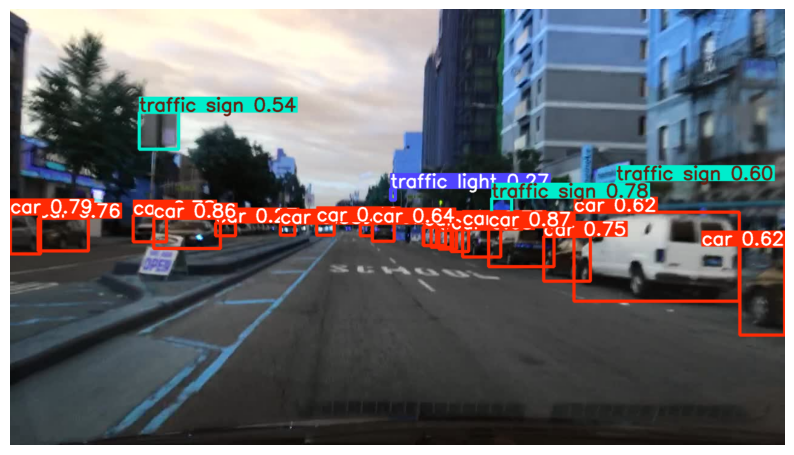

In [ ]:
# Load the fine-tuned model
model_3 = YOLO(f"{project_path}/model_3/weights/best.pt")

# Run inference on a test image
results = model_3("dataset1/images/val/b1c66a42-6f7d68ca.jpg")

mt.display_results(results)


### Using 8s model instead of 8n

In [ ]:
from ultralytics import YOLO

# Load a pre-trained YOLOv8 model (e.g., yolov8n.pt, yolov8s.pt, etc.) this time we're using the learned weights from the first model
model4 = YOLO("yolov8s.pt")  # You can choose different versions depending on the speed and accuracy you need

# Train the model with the updated syntax
model4.train(
    data=dataset2_path,  # Path to your custom dataset.yaml file
    epochs=10,            # Number of training epochs
    imgsz=640,            # Image size (YOLO generally works well with 640 or 1280)
    batch=32,              # Set batch size (e.g., 8) to control memory usage
    project=project_path, # Directory where training results will be saved
    name="model_4", # Folder name for saving the model
    exist_ok=True         # Overwrite existing run folder
)


100%|██████████| 21.5M/21.5M [00:00<00:00, 170MB/s]


Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/yaml_files/dataset2.yaml, epochs=10, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/FinalProjectRuntimeruns/train, name=model_4, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf

train: Scanning /content/dataset2/labels/train.cache... 6989 images, 11 backgrounds, 0 corrupt: 100%|██████████| 7000/7000 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/dataset2/labels/val.cache... 2000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2000/2000 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_4
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10       8.3G      1.545      1.803      1.077        386        640: 100%|██████████| 219/219 [00:38<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.72it/s]


                   all       2000      37036      0.508      0.265      0.259      0.138

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      7.93G      1.477      1.042      1.047        455        640: 100%|██████████| 219/219 [00:34<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.82it/s]


                   all       2000      37036      0.402      0.299      0.291      0.153

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      8.09G       1.47      1.004      1.046        391        640: 100%|██████████| 219/219 [00:33<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.85it/s]


                   all       2000      37036      0.425      0.269      0.276      0.146

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      8.08G      1.455     0.9708      1.039        382        640: 100%|██████████| 219/219 [00:34<00:00,  6.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.74it/s]


                   all       2000      37036      0.438      0.287      0.293      0.155

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      8.13G      1.425     0.9276      1.028        437        640: 100%|██████████| 219/219 [00:33<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.85it/s]


                   all       2000      37036      0.459       0.31       0.32       0.17

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      7.98G      1.404     0.8911      1.018        454        640: 100%|██████████| 219/219 [00:33<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.84it/s]


                   all       2000      37036      0.463      0.337      0.341      0.184

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10       8.1G       1.38     0.8623      1.007        443        640: 100%|██████████| 219/219 [00:34<00:00,  6.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.64it/s]


                   all       2000      37036      0.587      0.336      0.352      0.189

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      7.97G      1.353     0.8284     0.9984        438        640: 100%|██████████| 219/219 [00:34<00:00,  6.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.87it/s]


                   all       2000      37036      0.582      0.355      0.359      0.196

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10         8G      1.336     0.8033     0.9916        371        640: 100%|██████████| 219/219 [00:33<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.82it/s]


                   all       2000      37036      0.612      0.355      0.373      0.205

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      7.97G      1.316     0.7764     0.9839        431        640: 100%|██████████| 219/219 [00:33<00:00,  6.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.76it/s]


                   all       2000      37036      0.605      0.362      0.384      0.212

10 epochs completed in 0.125 hours.
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_4/weights/last.pt, 22.5MB
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_4/weights/best.pt, 22.5MB

Validating /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_4/weights/best.pt...
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 11,129,454 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:15<00:00,  2.09it/s]


                   all       2000      37036      0.604      0.363      0.384      0.213
                   car       1971      20799      0.703      0.659      0.705      0.431
                 truck        527        803      0.512      0.497      0.501      0.355
                   bus        245        317      0.464      0.483      0.442       0.33
                 motor         68         89       0.43      0.146      0.207      0.104
                  bike         99        204      0.487      0.284      0.302      0.143
                person        618       2449        0.7      0.413      0.496      0.233
         traffic light       1112       5261      0.596      0.437      0.442      0.157
          traffic sign       1618       6990      0.628      0.454      0.495      0.254
                 train          4          5          1          0          0          0
                 rider         95        119      0.521      0.252      0.253      0.118
Speed: 0.1ms preproce

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c1a165c5270>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0


image 1/1 /content/dataset1/images/test/dbde2819-2a939dc6.jpg: 384x640 13 cars, 2 persons, 1 traffic light, 1 traffic sign, 1 rider, 11.2ms
Speed: 1.8ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


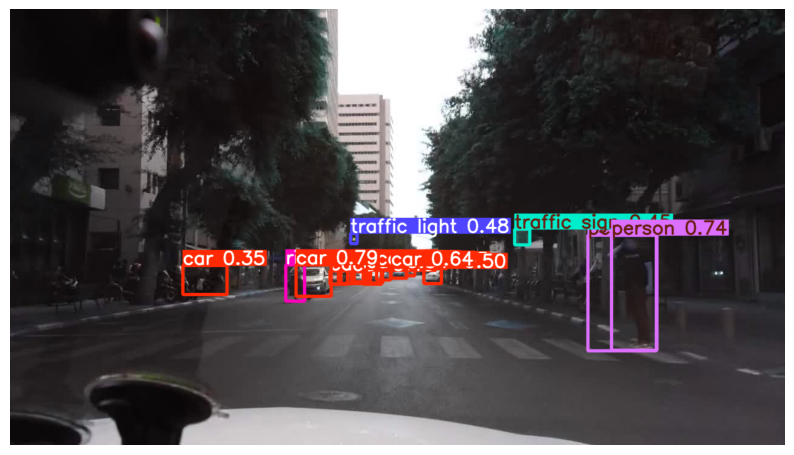

In [19]:
# Load the fine-tuned model
model_4 = YOLO(f"{project_path}/model_4/weights/best.pt")


# Run inference on a test image
results = model_4("dataset1/images/test/dbde2819-2a939dc6.jpg")

mt.display_results(results)


### Training Model with FREEZED backbone layers (feature extraction layers)

In [ ]:
from ultralytics import YOLO

# Load a pre-trained YOLOv8 model
model5 = YOLO("yolov8s.pt")


# Train the model with the updated syntax
model5.train(
    data=dataset2_path,  # Path to your custom dataset.yaml file
    epochs=100,            # Number of training epochs
    imgsz=640,            # Image size (YOLO generally works well with 640 or 1280)
    batch=32,              # Set batch size (e.g., 8) to control memory usage
    project=project_path, # Directory where training results will be saved
    name="model_5", # Folder name for saving the model
    exist_ok=True,         # Overwrite existing run folder
    workers=6,             # Number of data loading workers
    save_period=2,         # Save model every 2 epochs
    freeze =10
)


Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/yaml_files/dataset2.yaml, epochs=100, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=2, cache=False, device=None, workers=6, project=/content/drive/MyDrive/FinalProjectRuntimeruns/train, name=model_5, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=10, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=F

train: Scanning /content/dataset2/labels/train.cache... 6989 images, 11 backgrounds, 0 corrupt: 100%|██████████| 7000/7000 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/dataset2/labels/val.cache... 2000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2000/2000 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_5/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 6 dataloader workers
Logging results to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_5
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      7.51G       1.53      1.672      1.099        725        640: 100%|██████████| 219/219 [00:29<00:00,  7.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.86it/s]


                   all       2000      37036      0.518      0.266      0.271      0.152

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      6.46G      1.454      1.059      1.039        679        640: 100%|██████████| 219/219 [00:29<00:00,  7.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.85it/s]


                   all       2000      37036      0.436      0.288      0.295      0.164

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      8.12G      1.479      1.055       1.04        701        640: 100%|██████████| 219/219 [00:28<00:00,  7.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.32it/s]


                   all       2000      37036      0.463      0.285      0.287      0.156

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      6.57G      1.495      1.044      1.048        796        640: 100%|██████████| 219/219 [00:28<00:00,  7.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.79it/s]


                   all       2000      37036      0.498      0.278      0.293      0.157

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      8.68G      1.473      1.004      1.043        753        640: 100%|██████████| 219/219 [00:27<00:00,  8.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.83it/s]


                   all       2000      37036      0.451      0.291      0.305      0.164

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      7.31G      1.462     0.9839      1.035        827        640: 100%|██████████| 219/219 [00:27<00:00,  7.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.81it/s]


                   all       2000      37036      0.554      0.293      0.308      0.168

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      7.19G      1.443     0.9608      1.032        926        640: 100%|██████████| 219/219 [00:27<00:00,  7.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.58it/s]


                   all       2000      37036      0.569      0.305      0.322      0.173

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      7.48G      1.433     0.9429      1.026        682        640: 100%|██████████| 219/219 [00:28<00:00,  7.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.82it/s]


                   all       2000      37036      0.539      0.323      0.328      0.177

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      7.61G      1.414     0.9253      1.019        758        640: 100%|██████████| 219/219 [00:27<00:00,  7.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.75it/s]


                   all       2000      37036      0.587      0.306      0.329      0.177

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      8.67G      1.417     0.9187      1.019        646        640: 100%|██████████| 219/219 [00:26<00:00,  8.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.84it/s]


                   all       2000      37036      0.614       0.31      0.339      0.182

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      6.72G      1.406     0.9106      1.012        863        640: 100%|██████████| 219/219 [00:28<00:00,  7.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.44it/s]


                   all       2000      37036      0.564      0.329      0.339      0.183

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      6.73G      1.395     0.9008      1.011        814        640: 100%|██████████| 219/219 [00:27<00:00,  7.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.78it/s]


                   all       2000      37036      0.559       0.33      0.336      0.182

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      5.26G      1.391      0.891      1.009        871        640: 100%|██████████| 219/219 [00:27<00:00,  8.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.80it/s]


                   all       2000      37036      0.583      0.317      0.334      0.181

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      6.29G      1.389     0.8862      1.008        713        640: 100%|██████████| 219/219 [00:27<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.75it/s]


                   all       2000      37036      0.548      0.337      0.346      0.188

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      5.61G      1.378     0.8769      1.001        791        640: 100%|██████████| 219/219 [00:27<00:00,  8.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.58it/s]


                   all       2000      37036       0.57      0.324      0.344      0.189

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      6.72G      1.374     0.8681          1        627        640: 100%|██████████| 219/219 [00:28<00:00,  7.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.83it/s]


                   all       2000      37036      0.563      0.336      0.345      0.189

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      7.53G      1.371     0.8667      1.001        606        640: 100%|██████████| 219/219 [00:27<00:00,  7.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.80it/s]


                   all       2000      37036        0.6      0.313      0.347      0.189

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      7.19G      1.369     0.8633     0.9987        686        640: 100%|██████████| 219/219 [00:26<00:00,  8.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.79it/s]


                   all       2000      37036      0.581      0.347      0.354      0.191

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      6.24G      1.363     0.8554     0.9985        770        640: 100%|██████████| 219/219 [00:27<00:00,  8.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.68it/s]


                   all       2000      37036       0.59      0.343      0.361      0.196

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      6.76G      1.356     0.8499     0.9951        766        640: 100%|██████████| 219/219 [00:28<00:00,  7.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.70it/s]


                   all       2000      37036      0.594       0.34       0.36      0.193

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      7.12G      1.353     0.8458     0.9931        691        640: 100%|██████████| 219/219 [00:26<00:00,  8.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.85it/s]


                   all       2000      37036      0.578      0.338      0.362      0.195

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100       6.7G      1.348      0.843     0.9903        559        640: 100%|██████████| 219/219 [00:27<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.83it/s]


                   all       2000      37036      0.602      0.336      0.362      0.196

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      6.18G      1.354     0.8435     0.9931        861        640: 100%|██████████| 219/219 [00:26<00:00,  8.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.64it/s]


                   all       2000      37036      0.592      0.353      0.364      0.199

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      7.47G       1.35     0.8391     0.9903        564        640: 100%|██████████| 219/219 [00:28<00:00,  7.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.61it/s]


                   all       2000      37036      0.562      0.343      0.354      0.195

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      6.74G      1.343     0.8323     0.9866        746        640: 100%|██████████| 219/219 [00:26<00:00,  8.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.66it/s]


                   all       2000      37036      0.583      0.337      0.356      0.196

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      6.24G      1.343     0.8315     0.9889        819        640: 100%|██████████| 219/219 [00:26<00:00,  8.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.83it/s]


                   all       2000      37036      0.571      0.351      0.365      0.198

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      9.08G      1.341     0.8294      0.988        861        640: 100%|██████████| 219/219 [00:26<00:00,  8.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.82it/s]


                   all       2000      37036      0.581      0.348      0.367      0.201

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      6.82G      1.335     0.8264     0.9856        754        640: 100%|██████████| 219/219 [00:29<00:00,  7.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.48it/s]


                   all       2000      37036      0.587       0.34       0.36      0.197

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      6.71G      1.331     0.8183     0.9835        785        640: 100%|██████████| 219/219 [00:27<00:00,  7.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.79it/s]


                   all       2000      37036      0.615      0.331      0.364      0.199

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      6.58G      1.329     0.8137     0.9841        785        640: 100%|██████████| 219/219 [00:26<00:00,  8.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.79it/s]


                   all       2000      37036      0.595      0.349      0.368      0.203

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      6.75G      1.331     0.8166     0.9825        792        640: 100%|██████████| 219/219 [00:27<00:00,  8.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.78it/s]


                   all       2000      37036      0.592      0.348      0.368      0.197

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      5.26G      1.323     0.8114     0.9807        751        640: 100%|██████████| 219/219 [00:27<00:00,  7.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.60it/s]


                   all       2000      37036      0.604      0.343      0.371      0.202

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      7.03G      1.331     0.8111     0.9795        906        640: 100%|██████████| 219/219 [00:27<00:00,  7.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.96it/s]


                   all       2000      37036      0.617      0.345      0.371      0.203

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      5.38G      1.315     0.8011     0.9795        780        640: 100%|██████████| 219/219 [00:27<00:00,  7.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.83it/s]


                   all       2000      37036      0.602      0.345      0.369      0.201

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      6.06G      1.317     0.8053     0.9787        752        640: 100%|██████████| 219/219 [00:26<00:00,  8.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.78it/s]


                   all       2000      37036      0.597      0.353      0.379      0.206

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      5.83G       1.32     0.8014     0.9796        712        640: 100%|██████████| 219/219 [00:28<00:00,  7.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.75it/s]


                   all       2000      37036      0.581       0.36      0.369      0.202

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100       7.2G      1.314     0.7957     0.9744        964        640: 100%|██████████| 219/219 [00:27<00:00,  7.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.73it/s]


                   all       2000      37036      0.625      0.345      0.371      0.202

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      6.65G      1.315     0.7977     0.9761        765        640: 100%|██████████| 219/219 [00:26<00:00,  8.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.82it/s]


                   all       2000      37036      0.605      0.348      0.374      0.205

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      7.14G      1.309     0.7908     0.9738        905        640: 100%|██████████| 219/219 [00:26<00:00,  8.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.85it/s]


                   all       2000      37036      0.588      0.355      0.369        0.2

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      5.41G      1.315      0.792     0.9757        918        640: 100%|██████████| 219/219 [00:27<00:00,  7.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.63it/s]


                   all       2000      37036      0.597      0.349      0.372      0.205

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      6.14G      1.312     0.7899     0.9747        709        640: 100%|██████████| 219/219 [00:27<00:00,  7.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.78it/s]


                   all       2000      37036       0.59      0.356      0.372      0.204

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      5.53G       1.31     0.7868     0.9745        732        640: 100%|██████████| 219/219 [00:27<00:00,  7.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.91it/s]


                   all       2000      37036      0.603      0.357      0.377      0.206

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      6.61G      1.305     0.7876      0.972        725        640: 100%|██████████| 219/219 [00:26<00:00,  8.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.84it/s]


                   all       2000      37036      0.628      0.343       0.38      0.208

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100       8.9G      1.303     0.7834     0.9712        756        640: 100%|██████████| 219/219 [00:28<00:00,  7.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.63it/s]


                   all       2000      37036      0.619      0.356       0.38      0.207

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      6.46G      1.301     0.7805     0.9717        889        640: 100%|██████████| 219/219 [00:28<00:00,  7.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.73it/s]


                   all       2000      37036      0.519      0.342      0.379      0.209

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100       7.3G      1.301     0.7785     0.9708        818        640: 100%|██████████| 219/219 [00:27<00:00,  8.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.77it/s]


                   all       2000      37036      0.477      0.361      0.375      0.205

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      6.05G      1.298     0.7772     0.9709        753        640: 100%|██████████| 219/219 [00:28<00:00,  7.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.90it/s]


                   all       2000      37036      0.519      0.355      0.377      0.208

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      6.77G        1.3     0.7753     0.9696        537        640: 100%|██████████| 219/219 [00:28<00:00,  7.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.24it/s]


                   all       2000      37036      0.602      0.363      0.377      0.207

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      6.02G      1.289      0.769     0.9679        879        640: 100%|██████████| 219/219 [00:28<00:00,  7.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.75it/s]


                   all       2000      37036      0.594      0.364      0.381      0.208

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      6.08G      1.291     0.7677     0.9683        709        640: 100%|██████████| 219/219 [00:26<00:00,  8.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.81it/s]


                   all       2000      37036      0.609      0.351      0.381      0.207

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      6.08G      1.297     0.7702     0.9667        680        640: 100%|██████████| 219/219 [00:27<00:00,  8.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.86it/s]


                   all       2000      37036      0.579       0.36      0.377      0.208

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      6.88G      1.286     0.7638     0.9652        824        640: 100%|██████████| 219/219 [00:26<00:00,  8.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.64it/s]


                   all       2000      37036      0.511      0.353      0.378      0.207

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      7.42G      1.289     0.7636     0.9645        760        640: 100%|██████████| 219/219 [00:28<00:00,  7.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.81it/s]


                   all       2000      37036      0.621      0.344      0.377      0.207

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      7.14G      1.287     0.7616     0.9642        777        640: 100%|██████████| 219/219 [00:27<00:00,  8.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.56it/s]


                   all       2000      37036      0.601      0.363      0.381      0.208

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      5.52G       1.28     0.7562     0.9624        661        640: 100%|██████████| 219/219 [00:26<00:00,  8.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.84it/s]


                   all       2000      37036       0.62      0.355      0.381      0.207

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      5.13G      1.286     0.7605     0.9641        675        640: 100%|██████████| 219/219 [00:27<00:00,  8.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.80it/s]


                   all       2000      37036       0.62      0.352      0.379      0.206

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      7.53G      1.281      0.753     0.9625        625        640: 100%|██████████| 219/219 [00:29<00:00,  7.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.44it/s]


                   all       2000      37036      0.593      0.362       0.38      0.208

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      7.04G      1.281     0.7549     0.9614        678        640: 100%|██████████| 219/219 [00:26<00:00,  8.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.53it/s]


                   all       2000      37036      0.604      0.361      0.381      0.207

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100       6.6G      1.275     0.7541      0.961        778        640: 100%|██████████| 219/219 [00:27<00:00,  8.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.90it/s]


                   all       2000      37036      0.506      0.358      0.381      0.207

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      6.76G       1.28     0.7532     0.9626        627        640: 100%|██████████| 219/219 [00:27<00:00,  8.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.88it/s]


                   all       2000      37036      0.599      0.364      0.383      0.208

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100       7.3G      1.273     0.7505     0.9605        700        640: 100%|██████████| 219/219 [00:27<00:00,  7.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.52it/s]


                   all       2000      37036      0.579      0.374      0.383      0.208

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      6.22G      1.279     0.7524     0.9608        664        640: 100%|██████████| 219/219 [00:28<00:00,  7.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.81it/s]


                   all       2000      37036      0.526      0.352      0.381      0.208

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      6.98G      1.275     0.7525     0.9595        813        640: 100%|██████████| 219/219 [00:27<00:00,  8.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.87it/s]


                   all       2000      37036      0.612      0.367      0.388      0.212

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      7.82G      1.274     0.7456     0.9597        723        640: 100%|██████████| 219/219 [00:27<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.88it/s]


                   all       2000      37036      0.619      0.358      0.383      0.209

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100       6.6G      1.272     0.7452     0.9593        791        640: 100%|██████████| 219/219 [00:29<00:00,  7.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.29it/s]


                   all       2000      37036      0.604      0.365      0.381      0.209

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      7.11G      1.269     0.7414     0.9572       1014        640: 100%|██████████| 219/219 [00:28<00:00,  7.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.46it/s]


                   all       2000      37036       0.53      0.348       0.38      0.208

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      5.56G       1.27     0.7428     0.9575        715        640: 100%|██████████| 219/219 [00:30<00:00,  7.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.71it/s]


                   all       2000      37036      0.609      0.363      0.386      0.211

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100       7.6G      1.266     0.7396     0.9571        589        640: 100%|██████████| 219/219 [00:28<00:00,  7.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.86it/s]


                   all       2000      37036      0.622      0.359      0.387      0.211

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      5.65G      1.268     0.7388     0.9559        835        640: 100%|██████████| 219/219 [00:31<00:00,  6.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.55it/s]


                   all       2000      37036      0.597      0.365      0.383      0.209

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      8.56G      1.267     0.7352     0.9557        771        640: 100%|██████████| 219/219 [00:29<00:00,  7.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.80it/s]


                   all       2000      37036      0.618      0.362      0.386       0.21

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      7.67G      1.267     0.7381     0.9568        731        640: 100%|██████████| 219/219 [00:27<00:00,  7.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:10<00:00,  3.09it/s]


                   all       2000      37036      0.595      0.365      0.385      0.211

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      6.49G      1.255     0.7315     0.9543        788        640: 100%|██████████| 219/219 [00:27<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.90it/s]


                   all       2000      37036      0.508      0.369      0.385      0.211

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      7.01G      1.262     0.7328     0.9556       1067        640: 100%|██████████| 219/219 [00:32<00:00,  6.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.63it/s]


                   all       2000      37036      0.613      0.364      0.387      0.211

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100       5.9G      1.253     0.7278     0.9543        741        640: 100%|██████████| 219/219 [00:27<00:00,  8.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.83it/s]


                   all       2000      37036      0.616      0.356      0.384       0.21

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      5.51G      1.256      0.729     0.9536        813        640: 100%|██████████| 219/219 [00:27<00:00,  8.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:10<00:00,  3.03it/s]


                   all       2000      37036      0.505      0.367      0.384       0.21

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      5.25G      1.255     0.7289     0.9544        492        640: 100%|██████████| 219/219 [00:26<00:00,  8.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.47it/s]


                   all       2000      37036      0.606       0.36      0.385       0.21

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      5.72G      1.254     0.7233     0.9509        740        640: 100%|██████████| 219/219 [00:27<00:00,  7.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.66it/s]


                   all       2000      37036      0.598      0.375      0.389      0.212

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      7.87G      1.249     0.7212     0.9517        897        640: 100%|██████████| 219/219 [00:29<00:00,  7.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.75it/s]


                   all       2000      37036      0.603      0.366      0.387      0.211

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      5.19G      1.242     0.7203     0.9494        612        640: 100%|██████████| 219/219 [00:27<00:00,  8.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.84it/s]


                   all       2000      37036      0.607      0.366      0.388      0.212

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      6.81G      1.248     0.7224     0.9506        830        640: 100%|██████████| 219/219 [00:26<00:00,  8.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.87it/s]


                   all       2000      37036      0.602      0.365      0.386      0.209

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      7.63G      1.248     0.7183     0.9504        755        640: 100%|██████████| 219/219 [00:27<00:00,  7.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.30it/s]


                   all       2000      37036      0.609      0.361      0.387      0.211

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      6.44G      1.243     0.7146     0.9493        693        640: 100%|██████████| 219/219 [00:28<00:00,  7.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.26it/s]


                   all       2000      37036      0.612      0.363      0.387      0.213

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      5.84G      1.246      0.719     0.9507        700        640: 100%|██████████| 219/219 [00:26<00:00,  8.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.54it/s]


                   all       2000      37036      0.628      0.356      0.387      0.212

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      7.21G      1.241     0.7154     0.9478        782        640: 100%|██████████| 219/219 [00:27<00:00,  7.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.55it/s]


                   all       2000      37036      0.638      0.356      0.388      0.213

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      7.13G      1.237     0.7085     0.9456        913        640: 100%|██████████| 219/219 [00:27<00:00,  8.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.60it/s]


                   all       2000      37036      0.617      0.364      0.389      0.214

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      5.97G      1.241     0.7094     0.9469        906        640: 100%|██████████| 219/219 [00:28<00:00,  7.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.64it/s]


                   all       2000      37036      0.606       0.37      0.389      0.213

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      6.46G      1.236     0.7085     0.9468        868        640: 100%|██████████| 219/219 [00:27<00:00,  7.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.82it/s]


                   all       2000      37036      0.612      0.368      0.387      0.212

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      6.49G      1.233     0.7087     0.9479        707        640: 100%|██████████| 219/219 [00:29<00:00,  7.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.80it/s]


                   all       2000      37036      0.629      0.359      0.388      0.211

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      6.96G      1.237      0.705     0.9475        954        640: 100%|██████████| 219/219 [00:27<00:00,  8.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.74it/s]


                   all       2000      37036      0.608      0.369      0.387      0.211

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      7.81G      1.233     0.7033     0.9451        764        640: 100%|██████████| 219/219 [00:28<00:00,  7.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.33it/s]


                   all       2000      37036      0.517      0.362      0.386      0.211
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      4.81G      1.332     0.7859     0.9731        421        640: 100%|██████████| 219/219 [00:29<00:00,  7.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.84it/s]


                   all       2000      37036      0.499      0.373      0.381      0.206

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      4.71G       1.32     0.7648     0.9674        457        640: 100%|██████████| 219/219 [00:25<00:00,  8.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.84it/s]


                   all       2000      37036      0.501      0.355      0.371      0.201

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      4.78G      1.313     0.7586     0.9642        383        640: 100%|██████████| 219/219 [00:26<00:00,  8.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.78it/s]


                   all       2000      37036      0.474      0.352      0.364      0.198

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      4.73G      1.307     0.7542     0.9625        454        640: 100%|██████████| 219/219 [00:26<00:00,  8.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.61it/s]


                   all       2000      37036      0.476      0.346      0.362      0.196

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      4.74G      1.307     0.7499      0.962        473        640: 100%|██████████| 219/219 [00:27<00:00,  8.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.91it/s]


                   all       2000      37036      0.486      0.342      0.362      0.195

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      4.51G      1.302     0.7463     0.9594        507        640: 100%|██████████| 219/219 [00:26<00:00,  8.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.83it/s]


                   all       2000      37036      0.483      0.342      0.361      0.195

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100       4.8G        1.3      0.743       0.96        411        640: 100%|██████████| 219/219 [00:25<00:00,  8.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.48it/s]


                   all       2000      37036      0.489      0.341      0.359      0.195

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      4.71G      1.299     0.7408     0.9595        463        640: 100%|██████████| 219/219 [00:26<00:00,  8.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.79it/s]


                   all       2000      37036      0.486      0.342      0.357      0.194

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      4.51G      1.297     0.7427      0.958        445        640: 100%|██████████| 219/219 [00:26<00:00,  8.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.69it/s]


                   all       2000      37036       0.49      0.339      0.357      0.195

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      4.44G      1.297     0.7363     0.9585        441        640: 100%|██████████| 219/219 [00:25<00:00,  8.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.78it/s]


                   all       2000      37036      0.494      0.338      0.357      0.195

100 epochs completed in 1.059 hours.
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_5/weights/last.pt, 22.5MB
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_5/weights/best.pt, 22.5MB

Validating /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_5/weights/best.pt...
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 11,129,454 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:15<00:00,  2.05it/s]


                   all       2000      37036      0.618      0.365      0.389      0.214
                   car       1971      20799       0.72      0.643      0.697      0.424
                 truck        527        803      0.541      0.476      0.479      0.345
                   bus        245        317      0.543      0.451      0.465      0.349
                 motor         68         89      0.389      0.202      0.234      0.106
                  bike         99        204      0.564      0.299      0.317      0.141
                person        618       2449      0.608      0.452      0.496      0.236
         traffic light       1112       5261      0.626      0.393      0.426       0.15
          traffic sign       1618       6990      0.641      0.453      0.492      0.245
                 train          4          5          1          0          0          0
                 rider         95        119      0.543      0.277      0.288      0.139
Speed: 0.1ms preproce

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c1a1798d6c0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0


image 1/1 /content/dataset1/images/test/dbde2819-2a939dc6.jpg: 384x640 9 cars, 5 motors, 1 person, 2 traffic signs, 43.7ms
Speed: 1.7ms preprocess, 43.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


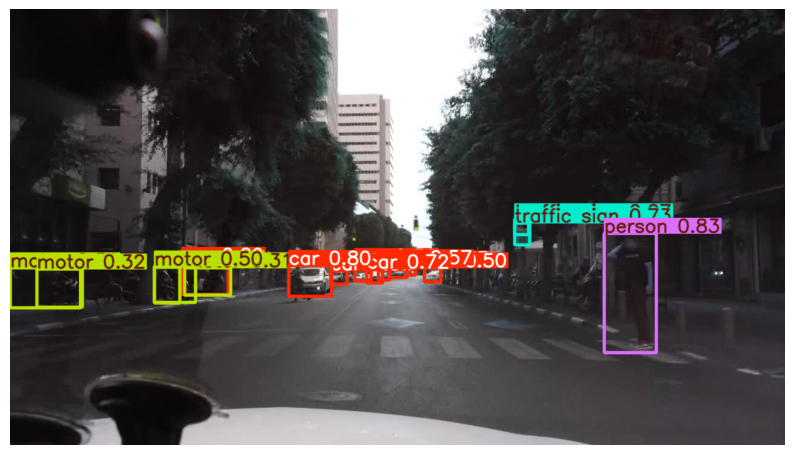

In [18]:
# Load the fine-tuned model
model_5 = YOLO(f"{project_path}/model_5/weights/best.pt")

# Run inference on a test image
results = model_5("dataset1/images/test/dbde2819-2a939dc6.jpg")

mt.display_results(results)


### Training Model with 100k images

#### Training using CPU only

In [ ]:
#model 6

from ultralytics import YOLO

# Load a pre-trained YOLOv8 model (e.g., yolov8n.pt, yolov8s.pt, etc.)
model6 = YOLO("yolov8n.pt")  # You can choose different versions depending on the speed and accuracy you need

# Train the model with the updated syntax
model6.train(
    data=dataset1_path,
    epochs=5,
    imgsz=640,
    batch=64,
    project=project_path,
    name="model_6",
    exist_ok=True,
    device=0,
    patience=3,
)



Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/yaml_files/dataset1.yaml, epochs=5, time=None, patience=3, batch=64, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=/content/drive/MyDrive/FinalProjectRuntimeruns/train, name=model_6, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False

train: Scanning /content/dataset1/labels/train... 69863 images, 137 backgrounds, 0 corrupt: 100%|██████████| 70000/70000 [01:11<00:00, 979.95it/s] 

train: WARNING ⚠️ /content/dataset1/images/train/75055858-7d04a650.jpg: 1 duplicate labels removed


train: New cache created: /content/dataset1/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/dataset1/labels/val... 10000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 10000/10000 [00:11<00:00, 869.78it/s]


val: New cache created: /content/dataset1/labels/val.cache
Plotting labels to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_6/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_6
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5        19G      1.523      1.465      1.046       1528        640: 100%|██████████| 1094/1094 [06:03<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [01:20<00:00,  1.01s/it]


                   all      10000     185526      0.562      0.281      0.285      0.153

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      16.5G      1.426     0.9961      1.017       1518        640: 100%|██████████| 1094/1094 [04:25<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:38<00:00,  2.04it/s]


                   all      10000     185526      0.445      0.314      0.317      0.169

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      16.7G      1.405     0.9365      1.012       1402        640: 100%|██████████| 1094/1094 [04:25<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:38<00:00,  2.06it/s]


                   all      10000     185526      0.564      0.325      0.332      0.179

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5        16G      1.375     0.8939      1.002       1730        640: 100%|██████████| 1094/1094 [04:25<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:37<00:00,  2.10it/s]


                   all      10000     185526      0.597      0.339      0.361      0.197

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      18.2G      1.348     0.8561     0.9914       1441        640: 100%|██████████| 1094/1094 [04:27<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:37<00:00,  2.10it/s]


                   all      10000     185526      0.617      0.354      0.383      0.211

5 epochs completed in 0.487 hours.
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_6/weights/last.pt, 6.2MB
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_6/weights/best.pt, 6.2MB

Validating /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_6/weights/best.pt...
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 3,007,598 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [01:17<00:00,  1.02it/s]


                   all      10000     185526      0.617      0.354      0.383      0.211
                   car       9879     102506      0.679      0.656      0.695      0.424
                 truck       2689       4245       0.51      0.497      0.494      0.349
                   bus       1242       1597      0.636      0.391      0.471      0.355
                 motor        334        452      0.567       0.15      0.223      0.102
                  bike        578       1007      0.451      0.299      0.288      0.137
                person       3220      13262       0.59      0.434      0.471      0.221
         traffic light       5653      26885       0.57      0.406      0.419      0.145
          traffic sign       8221      34908      0.625      0.433      0.476      0.237
                 train         14         15          1          0          0          0
                 rider        515        649      0.542      0.273      0.296      0.139
Speed: 0.1ms preproce

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c1a04f17b50>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0


image 1/1 /content/dataset1/images/test/dbde2819-2a939dc6.jpg: 384x640 10 cars, 1 motor, 1 bike, 3 persons, 1 traffic light, 2 traffic signs, 1 rider, 10.0ms
Speed: 1.9ms preprocess, 10.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


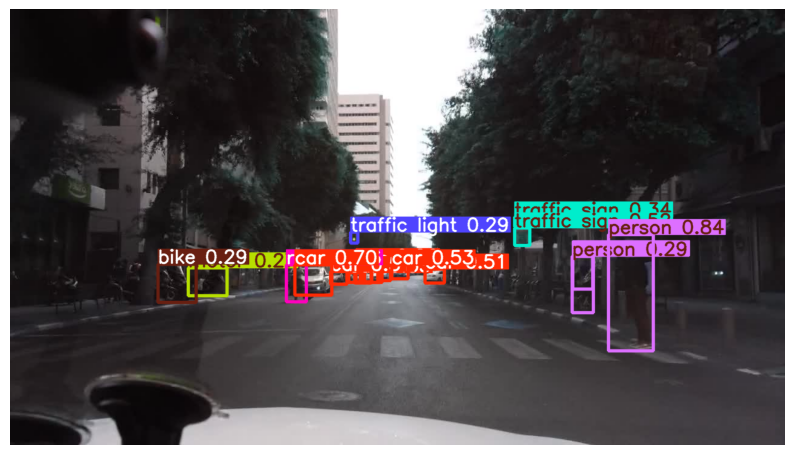

In [17]:
# Load the fine-tuned model
model_6 = YOLO(f"{project_path}/model_6/weights/best.pt")

# Run inference on a test image
results = model_6("dataset1/images/test/dbde2819-2a939dc6.jpg")

mt.display_results(results)


#### Training with GPU

In [ ]:
from ultralytics import YOLO

# Load a pre-trained YOLOv8 model (e.g., yolov8n.pt, yolov8s.pt, etc.)
model7 = YOLO("yolov8n.pt")  # You can choose different versions depending on the speed and accuracy you need

# Train the model with the updated syntax
model7.train(
    data=dataset1_path,
    epochs=5,
    imgsz=640,
    batch=64,
    project=project_path,
    name="model_7",
    exist_ok=True,
    device=0,  # Ensures GPU is used
    half=True  # Enables FP16 training
)



Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/yaml_files/dataset1.yaml, epochs=5, time=None, patience=100, batch=64, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=/content/drive/MyDrive/FinalProjectRuntimeruns/train, name=model_7, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=True, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=Fals

train: Scanning /content/dataset1/labels/train.cache... 69863 images, 137 backgrounds, 0 corrupt: 100%|██████████| 70000/70000 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/dataset1/images/train/75055858-7d04a650.jpg: 1 duplicate labels removed


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/dataset1/labels/val.cache... 10000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 10000/10000 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_7/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_7
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      19.1G      1.523      1.465      1.046       1528        640: 100%|██████████| 1094/1094 [04:37<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:43<00:00,  1.82it/s]


                   all      10000     185526      0.562      0.281      0.285      0.153

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      16.6G      1.426     0.9961      1.017       1518        640: 100%|██████████| 1094/1094 [04:46<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:41<00:00,  1.89it/s]


                   all      10000     185526      0.445      0.314      0.317      0.169

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      16.9G      1.405     0.9365      1.012       1402        640: 100%|██████████| 1094/1094 [04:39<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:40<00:00,  1.97it/s]


                   all      10000     185526      0.564      0.325      0.332      0.179

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      16.2G      1.375     0.8939      1.002       1730        640: 100%|██████████| 1094/1094 [04:42<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:38<00:00,  2.03it/s]


                   all      10000     185526      0.597      0.339      0.361      0.197

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      18.4G      1.348     0.8561     0.9914       1441        640: 100%|██████████| 1094/1094 [04:36<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:40<00:00,  1.95it/s]


                   all      10000     185526      0.617      0.354      0.383      0.211

5 epochs completed in 0.553 hours.
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_7/weights/last.pt, 6.2MB
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_7/weights/best.pt, 6.2MB

Validating /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_7/weights/best.pt...
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 3,007,598 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [02:15<00:00,  1.72s/it]


                   all      10000     185526      0.617      0.354      0.383      0.211
                   car       9879     102506      0.679      0.656      0.695      0.424
                 truck       2689       4245       0.51      0.497      0.494      0.349
                   bus       1242       1597      0.636      0.391      0.471      0.355
                 motor        334        452      0.567       0.15      0.223      0.102
                  bike        578       1007      0.451      0.299      0.288      0.137
                person       3220      13262       0.59      0.434      0.471      0.221
         traffic light       5653      26885       0.57      0.406      0.419      0.145
          traffic sign       8221      34908      0.625      0.433      0.476      0.237
                 train         14         15          1          0          0          0
                 rider        515        649      0.542      0.273      0.296      0.139
Speed: 0.1ms preproce

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c1a01afe710>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0


image 1/1 /content/dataset1/images/test/dbde2819-2a939dc6.jpg: 384x640 10 cars, 1 motor, 1 bike, 3 persons, 1 traffic light, 2 traffic signs, 1 rider, 8.3ms
Speed: 1.8ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


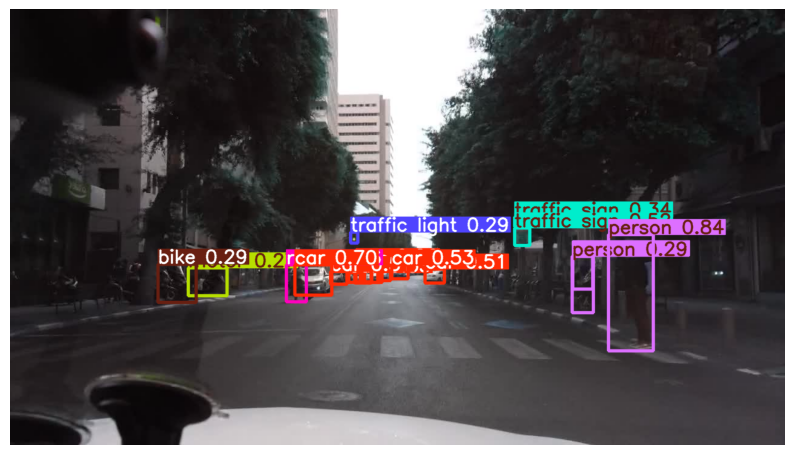

In [16]:
# Load the fine-tuned model
model_7 = YOLO(f"{project_path}/model_7/weights/best.pt")

# Run inference on a test image
results = model_7("dataset1/images/test/dbde2819-2a939dc6.jpg")

mt.display_results(results)


### Balance vs Unbalanced Dataset

In [ ]:
# 1500 random images (unbalanced not handpicked)

from ultralytics import YOLO

# Load a pre-trained YOLOv8 model (e.g., yolov8n.pt, yolov8s.pt, etc.) this time we're using the learned weights from the first model
model8 = YOLO("yolov8n.pt")  # You can choose different versions depending on the speed and accuracy you need

# Train the model with the updated syntax
model8.train(
    data=dataset3_path,  # Path to your custom dataset.yaml file
    epochs=10,            # Number of training epochs
    imgsz=640,            # Image size (YOLO generally works well with 640 or 1280)
    batch=32,             # Set batch size to control memory usage
    project=project_path, # Directory where training results will be saved
    name="model_8", # Folder name for saving the model
    exist_ok=True,        # Overwrite existing run folder
    workers=6,            # Number of data loading workers
    save_period=2,        # Save model every 2 epochs
    verbose=False,        # Suppress verbose output
    freeze=10,            # Freeze the backbone
    lr0=0.01,             # Initial learning rate
    lrf=0.01,              # Final learning rate (used for cosine decay scheduler)
    optimizer="Adam",
    cos_lr = True
)


100%|██████████| 6.25M/6.25M [00:00<00:00, 75.5MB/s]


Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/yaml_files/dataset3.yaml, epochs=10, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=2, cache=False, device=None, workers=6, project=/content/drive/MyDrive/FinalProjectRuntimeruns/train, name=model_8, exist_ok=True, pretrained=True, optimizer=Adam, verbose=False, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=10, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=Fa

100%|██████████| 755k/755k [00:00<00:00, 14.8MB/s]


Overriding model.yaml nc=80 with nc=10

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 66.7MB/s]


AMP: checks passed ✅


train: Scanning /content/dataset3/labels/train... 999 images, 1 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<00:00, 1138.00it/s]

train: New cache created: /content/dataset3/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/dataset3/labels/val... 500 images, 0 backgrounds, 0 corrupt: 100%|██████████| 500/500 [00:00<00:00, 978.02it/s]


val: New cache created: /content/dataset3/labels/val.cache
Plotting labels to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_8/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 6 dataloader workers
Logging results to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_8
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      3.08G      1.996      2.609      1.299        123        640: 100%|██████████| 32/32 [00:05<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.91it/s]

                   all        500       9393      0.291     0.0816     0.0399     0.0177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.83G      2.052      1.784      1.345        169        640: 100%|██████████| 32/32 [00:03<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.81it/s]

                   all        500       9393     0.0894      0.158     0.0396     0.0138



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.63G      1.979      1.621      1.305        122        640: 100%|██████████| 32/32 [00:03<00:00, 10.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.35it/s]

                   all        500       9393      0.457      0.158      0.066     0.0253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.91G      1.933      1.538      1.285        159        640: 100%|██████████| 32/32 [00:03<00:00, 10.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.55it/s]

                   all        500       9393      0.351      0.196     0.0963     0.0422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      3.11G      1.877      1.452      1.239        194        640: 100%|██████████| 32/32 [00:03<00:00,  9.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.68it/s]

                   all        500       9393      0.526      0.153      0.129     0.0569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.74G       1.82      1.394      1.216        197        640: 100%|██████████| 32/32 [00:03<00:00, 10.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.82it/s]

                   all        500       9393      0.422      0.198      0.145     0.0666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.65G      1.763      1.344      1.203         94        640: 100%|██████████| 32/32 [00:03<00:00,  9.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.64it/s]

                   all        500       9393      0.576      0.169      0.158     0.0755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      3.22G      1.736      1.304      1.172        113        640: 100%|██████████| 32/32 [00:03<00:00, 10.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.96it/s]

                   all        500       9393      0.568      0.195      0.182     0.0839



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      3.08G      1.673       1.23      1.152        177        640: 100%|██████████| 32/32 [00:03<00:00,  9.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.87it/s]

                   all        500       9393      0.566      0.211      0.189      0.089



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.88G      1.653      1.205      1.144        134        640: 100%|██████████| 32/32 [00:03<00:00,  9.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.62it/s]

                   all        500       9393      0.382      0.228       0.19     0.0919



10 epochs completed in 0.020 hours.
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_8/weights/last.pt, 6.2MB
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_8/weights/best.pt, 6.2MB

Validating /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_8/weights/best.pt...
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 3,007,598 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.73it/s]


                   all        500       9393       0.38      0.229      0.191     0.0919
Speed: 0.1ms preprocess, 0.3ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_8


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79c86ae4ab90>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0470


image 1/1 /content/dataset1/images/test/dbde2819-2a939dc6.jpg: 384x640 11 cars, 2 persons, 1 traffic sign, 8.4ms
Speed: 1.7ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


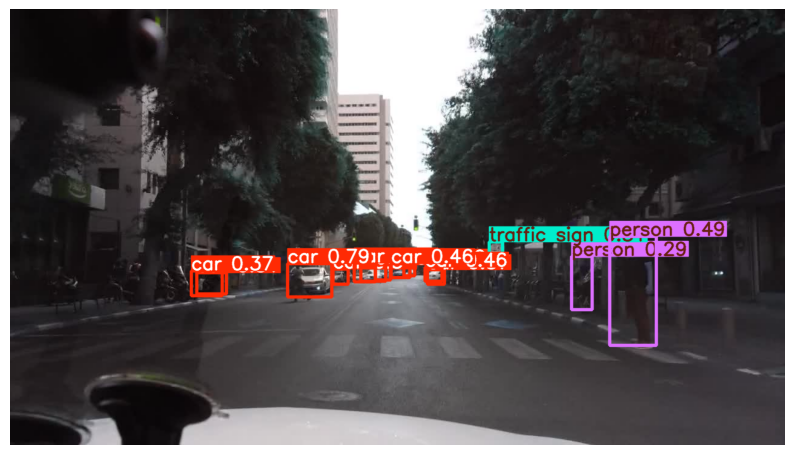

In [15]:
# Load the fine-tuned model
model_8 = YOLO(f"{project_path}/model_8/weights/best.pt")

# Run inference on a test image
results = model_8("dataset1/images/test/dbde2819-2a939dc6.jpg")

mt.display_results(results)


In [ ]:
# 1500 images (handpicked)

from ultralytics import YOLO

# Load a pre-trained YOLOv8 model (e.g., yolov8n.pt, yolov8s.pt, etc.) this time we're using the learned weights from the first model
model9 = YOLO("yolov8n.pt")  # You can choose different versions depending on the speed and accuracy you need

# Train the model with the updated syntax
model9.train(
    data=dataset2_path,  # Path to your custom dataset.yaml file
    epochs=10,            # Number of training epochs
    imgsz=640,            # Image size (YOLO generally works well with 640 or 1280)
    batch=32,             # Set batch size to control memory usage
    project=project_path, # Directory where training results will be saved
    name="model_9", # Folder name for saving the model
    exist_ok=True,        # Overwrite existing run folder
    workers=6,            # Number of data loading workers
    save_period=2,        # Save model every 2 epochs
    freeze=10,            # Freeze the backbone
    lr0=0.01,             # Initial learning rate
    lrf=0.01,              # Final learning rate (used for cosine decay scheduler)
    optimizer="Adam",
    cos_lr = True        # Overwrite existing run folder
)


Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/yaml_files/dataset2.yaml, epochs=10, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=2, cache=False, device=None, workers=6, project=/content/drive/MyDrive/FinalProjectRuntimeruns/train, name=model_9, exist_ok=True, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=10, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=Fal

train: Scanning /content/dataset2/labels/train... 6981 images, 19 backgrounds, 0 corrupt: 100%|██████████| 7000/7000 [00:06<00:00, 1099.99it/s]

train: WARNING ⚠️ /content/dataset2/images/train/75055858-7d04a650.jpg: 1 duplicate labels removed


train: New cache created: /content/dataset2/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/dataset2/labels/val... 2000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2000/2000 [00:02<00:00, 823.97it/s]

val: New cache created: /content/dataset2/labels/val.cache


Plotting labels to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_9/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 6 dataloader workers
Logging results to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_9
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      3.67G       1.87      1.728      1.221        424        640: 100%|██████████| 219/219 [00:27<00:00,  8.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.77it/s]


                   all       2000      37152      0.473      0.109       0.09     0.0429

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      3.59G      1.823      1.382      1.215        455        640: 100%|██████████| 219/219 [00:24<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.69it/s]


                   all       2000      37152      0.407      0.161      0.146     0.0683

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      3.75G      1.763      1.296      1.185        478        640: 100%|██████████| 219/219 [00:23<00:00,  9.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.80it/s]


                   all       2000      37152      0.232      0.204      0.159     0.0753

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      3.52G      1.731      1.252      1.171        479        640: 100%|██████████| 219/219 [00:24<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.60it/s]


                   all       2000      37152      0.341      0.168      0.154     0.0737

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      3.03G      1.679      1.194      1.146        492        640: 100%|██████████| 219/219 [00:24<00:00,  9.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.92it/s]


                   all       2000      37152      0.391      0.203      0.183     0.0914

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      3.49G      1.642      1.151      1.129        513        640: 100%|██████████| 219/219 [00:24<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.01it/s]


                   all       2000      37152      0.484      0.217      0.191     0.0953

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      3.74G      1.607      1.114      1.111        392        640: 100%|██████████| 219/219 [00:24<00:00,  9.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.97it/s]


                   all       2000      37152      0.433       0.24      0.213      0.108

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      3.82G      1.574      1.071      1.094        484        640: 100%|██████████| 219/219 [00:23<00:00,  9.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.01it/s]


                   all       2000      37152      0.425      0.254      0.221      0.112

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.92G      1.544      1.037      1.082        435        640: 100%|██████████| 219/219 [00:23<00:00,  9.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.93it/s]


                   all       2000      37152      0.471       0.26      0.231      0.118

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      3.95G      1.522      1.013      1.071        421        640: 100%|██████████| 219/219 [00:24<00:00,  8.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.05it/s]


                   all       2000      37152      0.436      0.256       0.23       0.12

10 epochs completed in 0.095 hours.
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_9/weights/last.pt, 6.2MB
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_9/weights/best.pt, 6.2MB

Validating /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_9/weights/best.pt...
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 3,007,598 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:13<00:00,  2.35it/s]


                   all       2000      37152      0.436      0.256       0.23       0.12
                   car       1972      20314       0.52      0.607      0.602      0.355
                 truck        511        815      0.376      0.368      0.287      0.187
                   bus        246        325      0.335      0.345      0.221      0.163
                 motor         70         83      0.161     0.0241     0.0595     0.0199
                  bike        126        221      0.268      0.109     0.0898     0.0337
                person        640       2510      0.434      0.349      0.338      0.148
         traffic light       1148       5571       0.44      0.276       0.25     0.0802
          traffic sign       1643       7175       0.46      0.341      0.331      0.156
                 train          4          5          1          0          0          0
                 rider        110        133      0.372      0.143      0.125     0.0542
Speed: 0.1ms preproce

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79c8abc6a7a0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0


image 1/1 /content/dataset1/images/test/dbde2819-2a939dc6.jpg: 384x640 10 cars, 1 person, 10.3ms
Speed: 1.9ms preprocess, 10.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


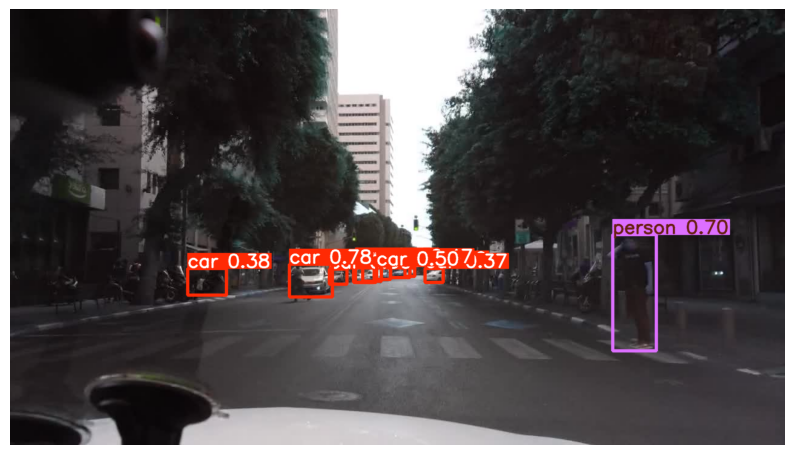

In [14]:
model_9 = YOLO(f"{project_path}/model_9/weights/best.pt")

# Run inference on a test image
results = model_9("dataset1/images/test/dbde2819-2a939dc6.jpg")

mt.display_results(results)

### Data Augmentation

In [ ]:
# data augmented

from ultralytics import YOLO

# Load a pre-trained YOLOv8 model (e.g., yolov8n.pt, yolov8s.pt, etc.) this time we're using the learned weights from the first model
model10 = YOLO("yolov8n.pt")  # You can choose different versions depending on the speed and accuracy you need

# Train the model with the updated syntax
model10.train(
    data=dataset4_path,  # Path to your custom dataset.yaml file
    epochs=10,            # Number of training epochs
    imgsz=640,            # Image size (YOLO generally works well with 640 or 1280)
    batch=32,             # Set batch size to control memory usage
    project=project_path, # Directory where training results will be saved
    name="model_10", # Folder name for saving the model
    exist_ok=True,        # Overwrite existing run folder
    workers=6,            # Number of data loading workers
    save_period=2,        # Save model every 2 epochs
    verbose=False,        # Suppress verbose output
    freeze=10,            # Freeze the backbone
    lr0=0.01,             # Initial learning rate
    lrf=0.01,              # Final learning rate (used for cosine decay scheduler)
    optimizer="Adam",
    cos_lr = True,        # Overwrite existing run folder
    augment=True,
)


Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/yaml_files/dataset4.yaml, epochs=10, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=2, cache=False, device=None, workers=6, project=/content/drive/MyDrive/FinalProjectRuntimeruns/train, name=model_10, exist_ok=True, pretrained=True, optimizer=Adam, verbose=False, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=10, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=Fa

train: Scanning /content/dataset4/labels/train... 999 images, 1 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<00:00, 1094.29it/s]


train: New cache created: /content/dataset4/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/dataset4/labels/val... 500 images, 0 backgrounds, 0 corrupt: 100%|██████████| 500/500 [00:00<00:00, 822.60it/s]


val: New cache created: /content/dataset4/labels/val.cache
Plotting labels to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_10/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 6 dataloader workers
Logging results to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_10
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      3.34G      1.982      2.697      1.343        169        640: 100%|██████████| 32/32 [00:04<00:00,  6.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.64it/s]

                   all        500      12536    0.00597     0.0828    0.00422    0.00214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      3.18G      2.031      1.839      1.405        164        640: 100%|██████████| 32/32 [00:03<00:00,  9.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.86it/s]

                   all        500      12536      0.206      0.213     0.0588     0.0235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      3.13G      1.963      1.647      1.351        156        640: 100%|██████████| 32/32 [00:03<00:00,  9.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.94it/s]

                   all        500      12536      0.207      0.287      0.131     0.0572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      3.28G      1.909       1.58      1.334        170        640: 100%|██████████| 32/32 [00:03<00:00,  9.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.38it/s]

                   all        500      12536      0.353       0.24      0.188     0.0821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.99G      1.843      1.492      1.296        194        640: 100%|██████████| 32/32 [00:03<00:00, 10.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.77it/s]

                   all        500      12536       0.34       0.28      0.226      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10       3.8G      1.805      1.435      1.269        130        640: 100%|██████████| 32/32 [00:03<00:00, 10.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.53it/s]

                   all        500      12536      0.411      0.311      0.279      0.135



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.69G      1.752      1.367      1.238        191        640: 100%|██████████| 32/32 [00:03<00:00,  9.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.55it/s]

                   all        500      12536      0.408      0.341      0.292      0.147



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      3.08G      1.717      1.335      1.217        231        640: 100%|██████████| 32/32 [00:03<00:00,  9.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.70it/s]

                   all        500      12536      0.472      0.341      0.327      0.168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      3.04G      1.668      1.281      1.198        171        640: 100%|██████████| 32/32 [00:03<00:00,  9.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.88it/s]

                   all        500      12536      0.486      0.351      0.331      0.175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      3.12G      1.641      1.244      1.189        108        640: 100%|██████████| 32/32 [00:03<00:00,  9.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.83it/s]

                   all        500      12536      0.496       0.35      0.344      0.183



10 epochs completed in 0.020 hours.
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_10/weights/last.pt, 6.2MB
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_10/weights/best.pt, 6.2MB

Validating /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_10/weights/best.pt...
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 3,007,598 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:06<00:00,  1.31it/s]


                   all        500      12536      0.466      0.347      0.336      0.183
Speed: 0.1ms preprocess, 1.7ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_10


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79c8d315e5c0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0470


image 1/1 /content/dataset1/images/test/dbde2819-2a939dc6.jpg: 384x640 8 cars, 1 person, 10.3ms
Speed: 1.8ms preprocess, 10.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


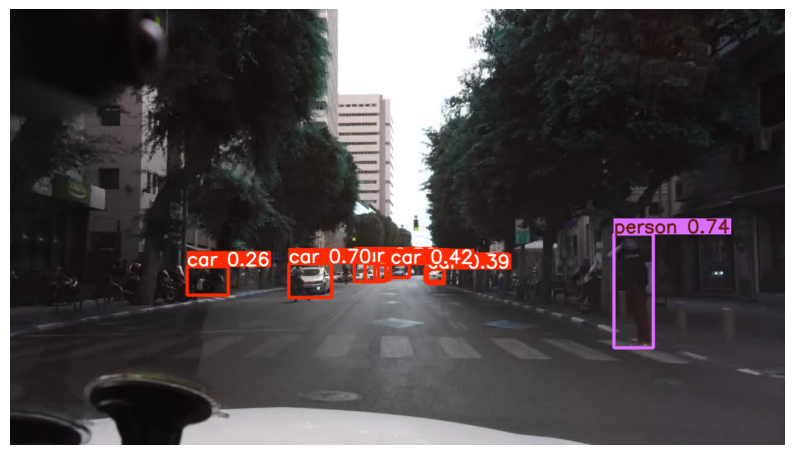

In [20]:
# Load the fine-tuned model
model_10 = YOLO(f"{project_path}/model_10/weights/best.pt")

# Run inference on a test image
results = model_10("dataset1/images/test/dbde2819-2a939dc6.jpg")

mt.display_results(results)


In [ ]:
# Using the preprocessed dataset, dataset5


from ultralytics import YOLO

# Load a pre-trained YOLOv8 model (e.g., yolov8n.pt, yolov8s.pt, etc.) this time we're using the learned weights from the first model
model10_5 = YOLO("yolov8s.pt")  # You can choose different versions depending on the speed and accuracy you need

# Train the model with the updated syntax
model10_5.train(
    data=dataset5_path,  # Path to your custom dataset.yaml file
    epochs=10,            # Number of training epochs
    imgsz=640,            # Image size (YOLO generally works well with 640 or 1280)
    batch=32,             # Set batch size to control memory usage
    project=project_path, # Directory where training results will be saved
    name="model_10_5", # Folder name for saving the model
    exist_ok=True,        # Overwrite existing run folder
    workers=6,            # Number of data loading workers
    save_period=2,        # Save model every 2 epochs
    verbose=False,        # Suppress verbose output
    freeze=10,            # Freeze the backbone
    lr0=0.01,             # Initial learning rate
    lrf=0.01,              # Final learning rate (used for cosine decay scheduler)
    optimizer="Adam",
    cos_lr = True,        # Overwrite existing run folder
    augment=True,
)

Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/yaml_files/dataset5.yaml, epochs=10, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=2, cache=False, device=None, workers=6, project=/content/drive/MyDrive/FinalProjectRuntimeruns/train, name=model_10_5, exist_ok=True, pretrained=True, optimizer=Adam, verbose=False, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=10, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=

train: Scanning /content/dataset5/labels/train... 2933 images, 1 backgrounds, 0 corrupt: 100%|██████████| 2934/2934 [00:02<00:00, 1034.58it/s]


train: New cache created: /content/dataset5/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/dataset5/labels/val... 1496 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1496/1496 [00:02<00:00, 679.68it/s]


val: New cache created: /content/dataset5/labels/val.cache
Plotting labels to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_10_5/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 6 dataloader workers
Logging results to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_10_5
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      5.66G      2.582      3.012      1.689        403        640: 100%|██████████| 92/92 [00:16<00:00,  5.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.04it/s]


                   all       1496      37566       0.17      0.144     0.0674     0.0239

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      5.56G      2.557      2.159      1.683        433        640: 100%|██████████| 92/92 [00:14<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.07it/s]


                   all       1496      37566       0.21       0.16     0.0836     0.0321

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      5.65G       2.47       2.05      1.624        431        640: 100%|██████████| 92/92 [00:13<00:00,  6.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:08<00:00,  2.72it/s]


                   all       1496      37566      0.241      0.187       0.12     0.0491

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      5.42G       2.41      1.972      1.582        394        640: 100%|██████████| 92/92 [00:13<00:00,  6.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.19it/s]


                   all       1496      37566      0.242      0.193      0.128     0.0538

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      5.33G      2.353      1.895      1.562        468        640: 100%|██████████| 92/92 [00:11<00:00,  7.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:08<00:00,  2.95it/s]


                   all       1496      37566      0.333      0.223      0.178     0.0769

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      5.44G      2.303      1.836      1.529        397        640: 100%|██████████| 92/92 [00:13<00:00,  6.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.39it/s]


                   all       1496      37566      0.358      0.221      0.187     0.0809

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      5.77G      2.253       1.77      1.497        415        640: 100%|██████████| 92/92 [00:13<00:00,  6.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:08<00:00,  2.81it/s]


                   all       1496      37566      0.378       0.23      0.203     0.0912

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      5.47G      2.189      1.695      1.458        369        640: 100%|██████████| 92/92 [00:13<00:00,  6.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:06<00:00,  3.57it/s]


                   all       1496      37566       0.39      0.239      0.216     0.0974

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      5.82G      2.137      1.644      1.428        422        640: 100%|██████████| 92/92 [00:12<00:00,  7.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:06<00:00,  3.54it/s]


                   all       1496      37566      0.406      0.247      0.226      0.106

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      5.55G      2.103      1.602      1.404        493        640: 100%|██████████| 92/92 [00:13<00:00,  6.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:06<00:00,  3.50it/s]


                   all       1496      37566      0.421      0.249      0.235      0.111

10 epochs completed in 0.069 hours.
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_10_5/weights/last.pt, 22.5MB
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_10_5/weights/best.pt, 22.5MB

Validating /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_10_5/weights/best.pt...
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 11,129,454 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:14<00:00,  1.62it/s]


                   all       1496      37566      0.438      0.241      0.234      0.114
Speed: 0.1ms preprocess, 1.4ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_10_5


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79c8c8ee9000>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0470

### Hyperparameter Combinations

#### Overriding Auto-assigned Metrics

In [ ]:
from ultralytics import YOLO

# Load a pre-trained YOLOv8 model
model11 = YOLO("yolov8s.pt")

# Train with Early Stopping
model11.train(
    data=dataset2_path,       # Dataset configuration
    epochs=50,                 # Total epochs
    patience=5,                # Stop if no improvement after 5 epochs
    imgsz=640,                 # Image size
    batch=32,                  # Batch size
    project=project_path,      # Output directory
    name="model_11",    # Experiment name
    exist_ok=True,              # Overwrite existing runs
    freeze = 10,
    cls=1.5,
    lr0=0.01,             # Initial learning rate
    lrf=0.01,
    save_period=2,
    optimizer="Adam"
)


100%|██████████| 21.5M/21.5M [00:00<00:00, 94.0MB/s]

Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)


engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/yaml_files/dataset2.yaml, epochs=50, time=None, patience=5, batch=32, imgsz=640, save=True, save_period=2, cache=False, device=None, workers=8, project=/content/drive/MyDrive/FinalProjectRuntimeruns/train, name=model_11, exist_ok=True, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=10, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format

train: Scanning /content/dataset2/labels/train.cache... 6981 images, 19 backgrounds, 0 corrupt: 100%|██████████| 7000/7000 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/dataset2/images/train/75055858-7d04a650.jpg: 1 duplicate labels removed
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/dataset2/labels/val.cache... 2000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2000/2000 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_11/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_11
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      5.78G      1.677      4.501      1.158        854        640: 100%|██████████| 219/219 [00:29<00:00,  7.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.47it/s]


                   all       2000      37152      0.499      0.184      0.183     0.0845

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      5.33G      1.635      3.439      1.149        700        640: 100%|██████████| 219/219 [00:28<00:00,  7.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.66it/s]


                   all       2000      37152      0.328      0.267      0.234      0.111

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      7.23G      1.609      3.305      1.139        674        640: 100%|██████████| 219/219 [00:27<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.82it/s]


                   all       2000      37152      0.533      0.265      0.248      0.122

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      7.33G      1.584      3.215      1.129       1032        640: 100%|██████████| 219/219 [00:26<00:00,  8.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.82it/s]


                   all       2000      37152      0.434       0.27       0.27      0.135

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      5.31G       1.56      3.118      1.114        795        640: 100%|██████████| 219/219 [00:26<00:00,  8.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.76it/s]


                   all       2000      37152      0.713      0.236      0.274      0.138

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      6.56G      1.537      3.068      1.103        714        640: 100%|██████████| 219/219 [00:26<00:00,  8.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.82it/s]


                   all       2000      37152      0.484      0.286      0.284      0.145

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      5.85G      1.542      3.069      1.107        592        640: 100%|██████████| 219/219 [00:27<00:00,  8.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.82it/s]


                   all       2000      37152      0.414        0.3      0.296      0.149

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      8.16G      1.531      3.022      1.103        739        640: 100%|██████████| 219/219 [00:27<00:00,  7.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.92it/s]


                   all       2000      37152       0.53      0.301      0.301      0.157

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50       5.7G      1.526       3.03        1.1        864        640: 100%|██████████| 219/219 [00:27<00:00,  8.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.84it/s]


                   all       2000      37152      0.543      0.299      0.297       0.15

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      5.53G      1.513      2.976      1.092        980        640: 100%|██████████| 219/219 [00:27<00:00,  8.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.80it/s]


                   all       2000      37152      0.433      0.304      0.309      0.157

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      4.53G      1.512      2.948      1.092        726        640: 100%|██████████| 219/219 [00:26<00:00,  8.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.88it/s]


                   all       2000      37152      0.434      0.307      0.307      0.155

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      6.01G      1.505      2.932      1.087        803        640: 100%|██████████| 219/219 [00:26<00:00,  8.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.89it/s]


                   all       2000      37152      0.475      0.302      0.312      0.159

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      5.61G      1.499      2.917      1.089        675        640: 100%|██████████| 219/219 [00:27<00:00,  7.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.87it/s]


                   all       2000      37152      0.468      0.301      0.322      0.164

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      6.25G       1.49      2.891      1.082        647        640: 100%|██████████| 219/219 [00:26<00:00,  8.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.94it/s]


                   all       2000      37152      0.591      0.298       0.32      0.164

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      6.48G      1.482      2.849      1.075        807        640: 100%|██████████| 219/219 [00:26<00:00,  8.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.94it/s]


                   all       2000      37152      0.597      0.306      0.326      0.169

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      5.58G      1.487      2.868       1.08        882        640: 100%|██████████| 219/219 [00:27<00:00,  8.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.90it/s]


                   all       2000      37152      0.442      0.325      0.323      0.168

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      4.55G       1.48      2.826      1.073        825        640: 100%|██████████| 219/219 [00:26<00:00,  8.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.88it/s]


                   all       2000      37152      0.569      0.307      0.322      0.167

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      7.73G      1.477      2.835      1.075        741        640: 100%|██████████| 219/219 [00:27<00:00,  7.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.92it/s]


                   all       2000      37152      0.561      0.309      0.313      0.162

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      6.76G      1.457      2.777      1.064        767        640: 100%|██████████| 219/219 [00:26<00:00,  8.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.85it/s]


                   all       2000      37152      0.446      0.326      0.249      0.124

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      6.21G      1.465      2.819      1.071        815        640: 100%|██████████| 219/219 [00:26<00:00,  8.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.84it/s]


                   all       2000      37152      0.526      0.322      0.325      0.164
EarlyStopping: Training stopped early as no improvement observed in last 5 epochs. Best results observed at epoch 15, best model saved as best.pt.
To update EarlyStopping(patience=5) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

20 epochs completed in 0.206 hours.
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_11/weights/last.pt, 22.5MB
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_11/weights/best.pt, 22.5MB

Validating /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_11/weights/best.pt...
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 11,129,454 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:14<00:00,  2.22it/s]


                   all       2000      37152      0.598      0.306      0.326      0.169
                   car       1972      20314      0.596      0.637       0.65      0.383
                 truck        511        815      0.417      0.471      0.428      0.279
                   bus        246        325      0.487      0.375      0.401      0.274
                 motor         70         83      0.833       0.06      0.198     0.0849
                  bike        126        221      0.253      0.176      0.158     0.0655
                person        640       2510      0.526      0.425      0.435      0.198
         traffic light       1148       5571      0.479      0.357      0.331      0.108
          traffic sign       1643       7175      0.506      0.449      0.431      0.207
                 train          4          5          1          0          0          0
                 rider        110        133      0.878      0.108      0.227     0.0883
Speed: 0.1ms preproce

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79c8caa04af0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0


image 1/1 /content/dataset1/images/test/dbde2819-2a939dc6.jpg: 384x640 12 cars, 3 persons, 2 traffic signs, 45.0ms
Speed: 1.8ms preprocess, 45.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


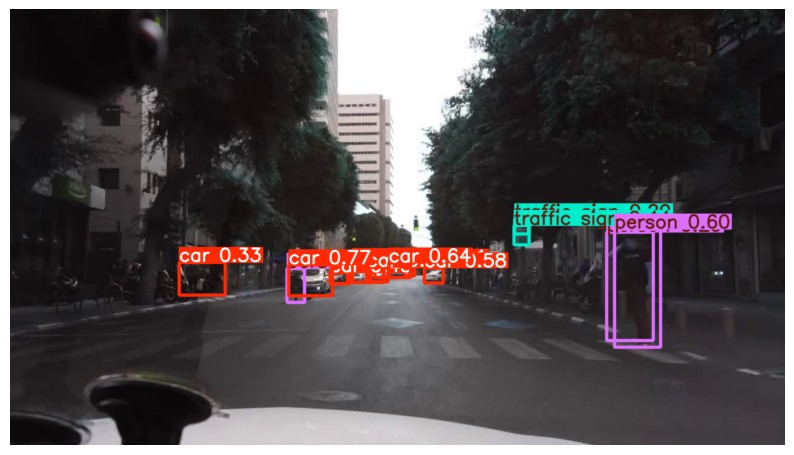

In [ ]:
# Load the fine-tuned model
model_11 = YOLO(f"{project_path}/model_11/weights/best.pt")

# Run inference on a test image
results = model_11("dataset1/images/test/dbde2819-2a939dc6.jpg")

mt.display_results(results)


In [ ]:


from ultralytics import YOLO

# Load a pre-trained YOLOv8 model
model12 = YOLO("yolov8n.pt")

# Train the model with a learning rate scheduler
model12.train(
    data=dataset2_path,  # Path to your custom dataset.yaml file
    epochs=25,            # Number of training epochs
    imgsz=640,            # Image size (YOLO generally works well with 640 or 1280)
    batch=32,             # Set batch size to control memory usage
    project=project_path, # Directory where training results will be saved
    name="model_12", # Folder name for saving the model
    exist_ok=True,        # Overwrite existing run folder
    workers=6,            # Number of data loading workers
    save_period=2,        # Save model every 2 epochs
    verbose=False,        # Suppress verbose output
    freeze=10,            # Freeze the backbone
    lr0=0.01,             # Initial learning rate
    lrf=0.01,              # Final learning rate (used for cosine decay scheduler)
    optimizer="Adam",
    cos_lr = True,
    patience = 7,
    cls=1.5
)


Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/yaml_files/dataset2.yaml, epochs=25, time=None, patience=7, batch=32, imgsz=640, save=True, save_period=2, cache=False, device=None, workers=6, project=/content/drive/MyDrive/FinalProjectRuntimeruns/train, name=model_12, exist_ok=True, pretrained=True, optimizer=Adam, verbose=False, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=10, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=Fal

train: Scanning /content/dataset2/labels/train.cache... 6981 images, 19 backgrounds, 0 corrupt: 100%|██████████| 7000/7000 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/dataset2/images/train/75055858-7d04a650.jpg: 1 duplicate labels removed
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/dataset2/labels/val.cache... 2000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2000/2000 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_12/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 6 dataloader workers
Logging results to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_12
Starting training for 25 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/25      5.44G      1.802      4.875      1.195        776        640: 100%|██████████| 219/219 [00:28<00:00,  7.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.80it/s]


                   all       2000      37152      0.612       0.16      0.141      0.064

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/25      6.51G       1.75      3.857      1.179        656        640: 100%|██████████| 219/219 [00:26<00:00,  8.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.97it/s]


                   all       2000      37152      0.377      0.215       0.18     0.0879

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/25       5.3G      1.711       3.68      1.161        669        640: 100%|██████████| 219/219 [00:25<00:00,  8.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.96it/s]


                   all       2000      37152      0.343      0.219      0.183     0.0873

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/25      5.75G      1.692      3.607      1.155        772        640: 100%|██████████| 219/219 [00:26<00:00,  8.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.06it/s]


                   all       2000      37152        0.3      0.244      0.207     0.0999

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/25      5.34G      1.661      3.475      1.141        768        640: 100%|██████████| 219/219 [00:26<00:00,  8.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.88it/s]


                   all       2000      37152      0.315      0.242      0.206      0.101

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/25      5.36G      1.623      3.371      1.126        766        640: 100%|██████████| 219/219 [00:27<00:00,  7.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.80it/s]


                   all       2000      37152      0.399      0.238      0.219      0.105

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/25      5.89G      1.627      3.366      1.123        888        640: 100%|██████████| 219/219 [00:26<00:00,  8.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.91it/s]


                   all       2000      37152      0.423      0.229      0.216      0.109

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/25      5.37G      1.613      3.325      1.121        767        640: 100%|██████████| 219/219 [00:25<00:00,  8.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.94it/s]


                   all       2000      37152      0.366      0.244      0.232      0.116

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/25      7.13G      1.601      3.283      1.114        798        640: 100%|██████████| 219/219 [00:25<00:00,  8.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.89it/s]


                   all       2000      37152      0.515      0.231      0.234      0.118

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/25      6.22G      1.593      3.254      1.108        581        640: 100%|██████████| 219/219 [00:25<00:00,  8.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.89it/s]


                   all       2000      37152      0.334      0.248      0.233      0.115

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/25      3.78G      1.581      3.201      1.103        825        640: 100%|██████████| 219/219 [00:25<00:00,  8.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.81it/s]


                   all       2000      37152      0.455      0.275      0.253      0.128

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/25      6.61G      1.577      3.187      1.098        768        640: 100%|██████████| 219/219 [00:26<00:00,  8.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.89it/s]


                   all       2000      37152      0.444      0.266      0.248      0.129

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/25      5.76G      1.561      3.132      1.091       1032        640: 100%|██████████| 219/219 [00:25<00:00,  8.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.99it/s]


                   all       2000      37152      0.368      0.266      0.254      0.131

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/25      4.91G       1.55      3.102      1.089        710        640: 100%|██████████| 219/219 [00:25<00:00,  8.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.01it/s]


                   all       2000      37152      0.382      0.265      0.259      0.133

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/25       5.2G      1.541      3.069      1.084        628        640: 100%|██████████| 219/219 [00:26<00:00,  8.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.96it/s]


                   all       2000      37152      0.375      0.276      0.262      0.133
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/25      3.87G      1.574      3.129      1.094        365        640: 100%|██████████| 219/219 [00:26<00:00,  8.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.82it/s]


                   all       2000      37152      0.372      0.265      0.248      0.128

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/25      3.68G      1.564      3.069      1.087        530        640: 100%|██████████| 219/219 [00:25<00:00,  8.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.93it/s]


                   all       2000      37152      0.478      0.267      0.259      0.132

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/25      4.35G      1.549       3.02      1.081        432        640: 100%|██████████| 219/219 [00:24<00:00,  9.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.91it/s]


                   all       2000      37152      0.525      0.256      0.262      0.133

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/25      4.19G      1.536      2.966      1.073        371        640: 100%|██████████| 219/219 [00:23<00:00,  9.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.95it/s]


                   all       2000      37152      0.491      0.264      0.263      0.136

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/25      3.99G      1.526      2.929      1.069        422        640: 100%|██████████| 219/219 [00:23<00:00,  9.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.98it/s]


                   all       2000      37152       0.51      0.263      0.267      0.138

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/25      3.96G      1.516       2.88      1.063        383        640: 100%|██████████| 219/219 [00:23<00:00,  9.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.93it/s]


                   all       2000      37152      0.488      0.269      0.267       0.14

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/25      4.13G      1.505      2.853       1.06        452        640: 100%|██████████| 219/219 [00:25<00:00,  8.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.79it/s]


                   all       2000      37152      0.517      0.268      0.274      0.142

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/25      3.58G      1.495      2.817      1.055        441        640: 100%|██████████| 219/219 [00:24<00:00,  8.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.08it/s]


                   all       2000      37152      0.493      0.284      0.277      0.145

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/25      3.84G      1.487      2.791      1.051        482        640: 100%|██████████| 219/219 [00:24<00:00,  8.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.05it/s]


                   all       2000      37152      0.537      0.268      0.282      0.147

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/25      3.25G      1.484      2.779      1.052        534        640: 100%|██████████| 219/219 [00:24<00:00,  8.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.93it/s]


                   all       2000      37152      0.531      0.267       0.28      0.147

25 epochs completed in 0.244 hours.
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_12/weights/last.pt, 6.2MB
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_12/weights/best.pt, 6.2MB

Validating /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_12/weights/best.pt...
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 3,007,598 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:13<00:00,  2.34it/s]


                   all       2000      37152      0.537      0.267      0.282      0.147
Speed: 0.1ms preprocess, 0.3ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_12


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79c8cc348b50>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0


image 1/1 /content/dataset1/images/test/dbde2819-2a939dc6.jpg: 384x640 10 cars, 4 persons, 1 traffic sign, 12.0ms
Speed: 2.0ms preprocess, 12.0ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)


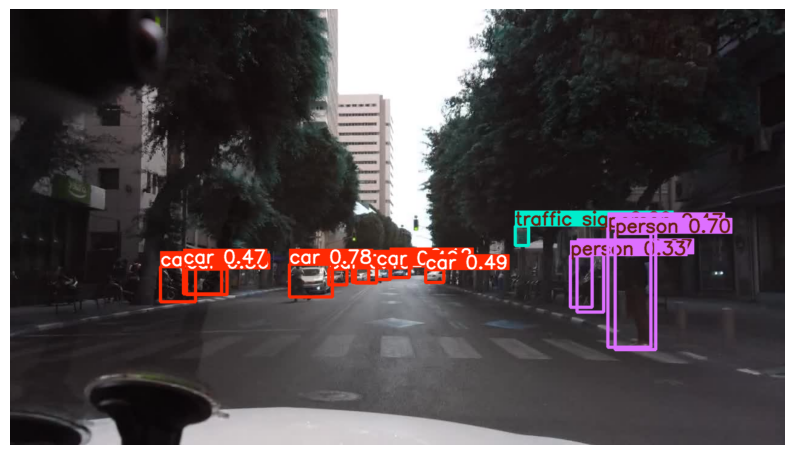

In [ ]:
# Load the fine-tuned model
model_12 = YOLO(f"{project_path}/model_12/weights/best.pt")

# Run inference on a test image
results = model_12("dataset1/images/test/dbde2819-2a939dc6.jpg")

mt.display_results(results)


### Dropouts and Regularization

In [ ]:
# Load a pre-trained YOLOv8 model
model13 = YOLO("yolov8s.pt")

# Updated Training Configuration
model13.train(
    data=dataset1_path,
    epochs=15,
    patience=7,              # Allow more epochs for stabilization
    imgsz=640,
    batch=32,
    project=project_path,
    name="model_13",
    exist_ok=True,
    freeze=10,               # Retain frozen layers
    cls=1.5,
    lr0=0.02,                # Increase learning rate for faster convergence
    lrf=0.01,                # Final learning rate
    optimizer="AdamW",       # Experiment with AdamW optimizer
    cos_lr=True,
    dropout=0.3,             # Add dropout for regularization
    save_period=2,
    augment=True, # Enable augmentation for better generalization
    verbose = True
)


Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/yaml_files/dataset1.yaml, epochs=15, time=None, patience=7, batch=32, imgsz=640, save=True, save_period=2, cache=False, device=None, workers=8, project=/content/drive/MyDrive/FinalProjectRuntimeruns/train, name=model_13, exist_ok=True, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=10, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.3, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=Fals

train: Scanning /content/dataset1/labels/train... 69863 images, 137 backgrounds, 0 corrupt: 100%|██████████| 70000/70000 [01:03<00:00, 1100.76it/s]

train: WARNING ⚠️ /content/dataset1/images/train/75055858-7d04a650.jpg: 1 duplicate labels removed


train: New cache created: /content/dataset1/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/dataset1/labels/val... 10000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 10000/10000 [00:10<00:00, 996.81it/s]


val: New cache created: /content/dataset1/labels/val.cache
Plotting labels to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_13/labels.jpg... 
optimizer: AdamW(lr=0.02, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_13
Starting training for 15 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/15      6.55G      1.539      3.265      1.084        542        640: 100%|██████████| 2188/2188 [04:50<00:00,  7.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 157/157 [00:41<00:00,  3.75it/s]


                   all      10000     185526      0.487       0.29      0.309      0.158

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/15      6.66G      1.474      2.885      1.056        440        640: 100%|██████████| 2188/2188 [04:43<00:00,  7.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 157/157 [00:41<00:00,  3.75it/s]


                   all      10000     185526      0.584      0.346      0.354      0.187

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/15      7.84G       1.43      2.743      1.035        507        640: 100%|██████████| 2188/2188 [04:30<00:00,  8.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 157/157 [00:42<00:00,  3.73it/s]


                   all      10000     185526      0.606      0.365      0.379      0.204

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/15      8.23G      1.404      2.658      1.023        484        640: 100%|██████████| 2188/2188 [04:29<00:00,  8.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 157/157 [00:41<00:00,  3.79it/s]


                   all      10000     185526      0.624      0.363      0.394      0.212

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/15      7.53G      1.386      2.591      1.013        532        640: 100%|██████████| 2188/2188 [04:30<00:00,  8.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 157/157 [00:41<00:00,  3.78it/s]


                   all      10000     185526      0.629      0.369        0.4      0.213
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/15      5.24G      1.433      2.665      1.021        227        640: 100%|██████████| 2188/2188 [04:17<00:00,  8.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 157/157 [00:42<00:00,  3.69it/s]


                   all      10000     185526       0.59      0.351      0.369      0.196

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/15      5.01G      1.414      2.594      1.013        256        640: 100%|██████████| 2188/2188 [04:15<00:00,  8.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 157/157 [00:41<00:00,  3.76it/s]


                   all      10000     185526       0.61      0.349      0.378      0.199

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/15      5.11G      1.401      2.549      1.007        365        640: 100%|██████████| 2188/2188 [04:19<00:00,  8.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 157/157 [00:41<00:00,  3.74it/s]


                   all      10000     185526      0.612      0.348      0.381        0.2

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/15      5.49G      1.389      2.508      1.002        270        640: 100%|██████████| 2188/2188 [04:18<00:00,  8.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 157/157 [00:43<00:00,  3.64it/s]


                   all      10000     185526      0.622       0.35      0.385      0.203

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/15      5.28G       1.38       2.47     0.9977        300        640: 100%|██████████| 2188/2188 [04:19<00:00,  8.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 157/157 [00:41<00:00,  3.74it/s]


                   all      10000     185526       0.62      0.353      0.387      0.204

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/15      5.29G      1.369      2.429      0.994        283        640: 100%|██████████| 2188/2188 [04:17<00:00,  8.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 157/157 [00:43<00:00,  3.63it/s]


                   all      10000     185526      0.606       0.36      0.389      0.205

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/15       4.9G      1.362      2.402     0.9913        293        640: 100%|██████████| 2188/2188 [04:17<00:00,  8.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 157/157 [00:42<00:00,  3.72it/s]


                   all      10000     185526      0.626      0.357      0.392      0.207
EarlyStopping: Training stopped early as no improvement observed in last 7 epochs. Best results observed at epoch 5, best model saved as best.pt.
To update EarlyStopping(patience=7) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

12 epochs completed in 1.040 hours.
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_13/weights/last.pt, 22.5MB
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_13/weights/best.pt, 22.5MB

Validating /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_13/weights/best.pt...
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 11,129,454 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 157/157 [01:16<00:00,  2.04it/s]


                   all      10000     185526      0.601      0.371      0.393      0.216
                   car       9879     102506      0.611      0.652      0.676      0.414
                 truck       2689       4245      0.534      0.501      0.496      0.346
                   bus       1242       1597      0.576      0.395      0.451      0.335
                 motor        334        452      0.707      0.202      0.299      0.133
                  bike        578       1007       0.44      0.329      0.311      0.148
                person       3220      13262      0.567      0.459      0.489      0.237
         traffic light       5653      26885      0.499        0.4      0.391      0.141
          traffic sign       8221      34908      0.588      0.458      0.488      0.246
                 train         14         15          1          0          0          0
                 rider        515        649      0.485       0.31      0.326      0.158
Speed: 0.1ms preproce

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79c8cfed4e50>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0


image 1/1 /content/dataset1/images/test/dbde2819-2a939dc6.jpg: 384x640 12 cars, 5 persons, 1 traffic light, 2 traffic signs, 11.3ms
Speed: 1.8ms preprocess, 11.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


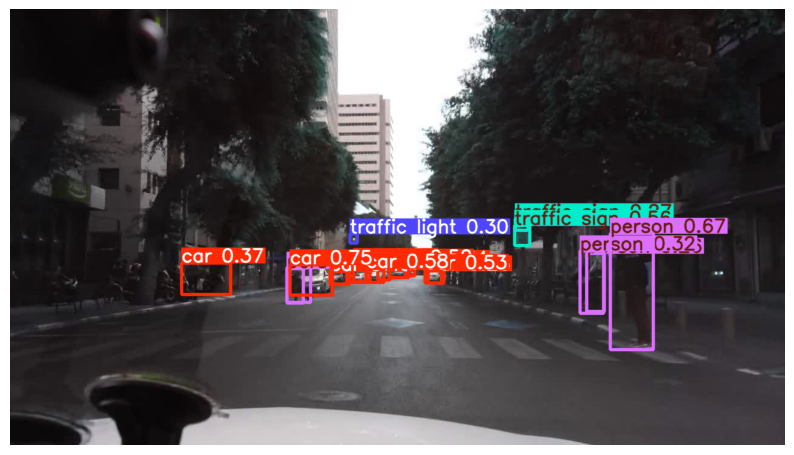

In [ ]:
# Load the fine-tuned model
model_13 = YOLO(f"{project_path}/model_13/weights/best.pt")

# Run inference on a test image
results = model_13("dataset1/images/test/dbde2819-2a939dc6.jpg")

mt.display_results(results)


## Finetuned Models

In [ ]:


from ultralytics import YOLO

# Load a pre-trained YOLOv8 model
model14 = YOLO("yolov8m.pt")

# Train the model with a learning rate scheduler
model14.train(
    data=dataset1_path,  # Path to your custom dataset.yaml file
    epochs=15,            # Number of training epochs
    imgsz=640,            # Image size (YOLO generally works well with 640 or 1280)
    batch=64,             # Set batch size to control memory usage
    project=project_path, # Directory where training results will be saved
    name="model_14", # Folder name for saving the model
    exist_ok=True,        # Overwrite existing run folder
    workers=6,            # Number of data loading workers
    save_period=5,        # Save model every 2 epochs
    verbose=False,        # Suppress verbose output
    freeze=10,            # Freeze the backbone
    lr0=0.01,             # Initial learning rate
    lrf=0.01,              # Final learning rate (used for cosine decay scheduler)
    optimizer="Adam",
    cos_lr = True,
    patience = 7,
    cls=1.5
)


100%|██████████| 49.7M/49.7M [00:00<00:00, 242MB/s]


Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/yaml_files/dataset1.yaml, epochs=15, time=None, patience=7, batch=64, imgsz=640, save=True, save_period=5, cache=False, device=None, workers=6, project=/content/drive/MyDrive/FinalProjectRuntimeruns/train, name=model_14, exist_ok=True, pretrained=True, optimizer=Adam, verbose=False, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=10, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=Fal

train: Scanning /content/dataset1/labels/train.cache... 69863 images, 137 backgrounds, 0 corrupt: 100%|██████████| 70000/70000 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/dataset1/images/train/75055858-7d04a650.jpg: 1 duplicate labels removed


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/dataset1/labels/val.cache... 10000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 10000/10000 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_14/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 6 dataloader workers
Logging results to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_14
Starting training for 15 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/15      15.5G      1.437      2.951      1.078       1486        640: 100%|██████████| 1094/1094 [05:26<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:45<00:00,  1.75it/s]


                   all      10000     185526      0.525      0.348      0.367      0.188

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/15      16.7G      1.429      2.728       1.08       1384        640: 100%|██████████| 1094/1094 [05:29<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:44<00:00,  1.76it/s]


                   all      10000     185526      0.512      0.373      0.387      0.203

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/15      14.3G      1.434      2.728      1.088       1837        640: 100%|██████████| 1094/1094 [05:22<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:43<00:00,  1.81it/s]


                   all      10000     185526      0.612      0.368      0.383      0.199

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/15      18.8G      1.424      2.685      1.082       1838        640: 100%|██████████| 1094/1094 [05:21<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:43<00:00,  1.80it/s]


                   all      10000     185526       0.62      0.376      0.397      0.209

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/15      15.1G      1.409      2.639      1.074       1499        640: 100%|██████████| 1094/1094 [05:21<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:43<00:00,  1.81it/s]


                   all      10000     185526      0.626      0.375      0.397      0.211
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/15      11.3G      1.463      2.714      1.093        747        640: 100%|██████████| 1094/1094 [05:21<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:45<00:00,  1.74it/s]


                   all      10000     185526      0.621      0.375      0.396       0.21

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/15      11.4G      1.447      2.653      1.084        904        640: 100%|██████████| 1094/1094 [05:17<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:46<00:00,  1.70it/s]


                   all      10000     185526      0.644      0.375      0.402      0.214

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/15      11.3G      1.429      2.603      1.075        911        640: 100%|██████████| 1094/1094 [05:12<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:46<00:00,  1.72it/s]


                   all      10000     185526      0.624      0.394      0.414      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/15      11.5G      1.415       2.55      1.068        826        640: 100%|██████████| 1094/1094 [05:16<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:45<00:00,  1.73it/s]


                   all      10000     185526      0.657      0.389      0.423      0.227

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/15      11.4G      1.396      2.491      1.058        841        640: 100%|██████████| 1094/1094 [05:17<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:47<00:00,  1.66it/s]


                   all      10000     185526       0.66      0.399      0.434      0.234

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/15      11.4G      1.378      2.434       1.05        879        640: 100%|██████████| 1094/1094 [05:21<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:45<00:00,  1.73it/s]


                   all      10000     185526      0.664      0.403      0.439      0.239

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/15      11.8G      1.362      2.379      1.044        816        640: 100%|██████████| 1094/1094 [05:21<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:45<00:00,  1.73it/s]


                   all      10000     185526      0.667      0.408      0.444      0.243

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/15      11.8G      1.346      2.328      1.036        862        640: 100%|██████████| 1094/1094 [05:24<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:47<00:00,  1.66it/s]


                   all      10000     185526      0.676      0.411      0.448      0.245

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/15      11.6G      1.332      2.278      1.029        758        640: 100%|██████████| 1094/1094 [05:20<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:50<00:00,  1.57it/s]


                   all      10000     185526      0.681      0.407      0.449      0.246

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/15      11.7G      1.322      2.247      1.025        759        640: 100%|██████████| 1094/1094 [05:23<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:45<00:00,  1.72it/s]


                   all      10000     185526      0.681      0.408      0.451      0.248

15 epochs completed in 1.584 hours.
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_14/weights/last.pt, 52.0MB
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_14/weights/best.pt, 52.0MB

Validating /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_14/weights/best.pt...
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [01:14<00:00,  1.06it/s]


                   all      10000     185526       0.68      0.408      0.451      0.248
Speed: 0.1ms preprocess, 0.9ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_14


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79c8c1048250>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0

In [11]:


from ultralytics import YOLO

# Load a pre-trained YOLOv8 model
model14_5 = YOLO("yolov8m.pt")

# Train the model with a learning rate scheduler
model14_5.train(
    data=dataset5_path,  # Path to your custom dataset.yaml file
    epochs=15,            # Number of training epochs
    imgsz=640,            # Image size (YOLO generally works well with 640 or 1280)
    batch=32,             # Set batch size to control memory usage
    project=project_path, # Directory where training results will be saved
    name="model_14_5", # Folder name for saving the model
    exist_ok=True,        # Overwrite existing run folder
    workers=6,            # Number of data loading workers
    save_period=5,        # Save model every 2 epochs
    verbose=False,        # Suppress verbose output
    freeze=10,            # Freeze the backbone
    lr0=0.01,             # Initial learning rate
    lrf=0.01,              # Final learning rate (used for cosine decay scheduler)
    optimizer="Adam",
    cos_lr = True,
    patience = 7,
    cls=1.5,
    augment=True
)


Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/yaml_files/dataset5.yaml, epochs=15, time=None, patience=7, batch=32, imgsz=640, save=True, save_period=5, cache=False, device=None, workers=6, project=/content/drive/MyDrive/FinalProjectRuntimeruns/train, name=model_14_5, exist_ok=True, pretrained=True, optimizer=Adam, verbose=False, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=10, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=Fa

train: Scanning /content/dataset5/labels/train.cache... 2933 images, 1 backgrounds, 0 corrupt: 100%|██████████| 2934/2934 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/dataset5/labels/val.cache... 1496 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1496/1496 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_14_5/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 6 dataloader workers
Logging results to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_14_5
Starting training for 15 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/15      6.45G      2.401      7.185      1.727        844        640: 100%|██████████| 92/92 [00:17<00:00,  5.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:09<00:00,  2.62it/s]


                   all       1496      37566      0.108      0.187     0.0576     0.0198

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/15      6.16G      2.408      5.844      1.713        953        640: 100%|██████████| 92/92 [00:15<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.02it/s]


                   all       1496      37566      0.326      0.225      0.185     0.0756

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/15      8.37G      2.283      5.354       1.63        759        640: 100%|██████████| 92/92 [00:14<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.26it/s]


                   all       1496      37566      0.347      0.233      0.187     0.0772

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/15      7.37G      2.264       5.21      1.622        863        640: 100%|██████████| 92/92 [00:14<00:00,  6.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.13it/s]


                   all       1496      37566      0.434      0.238      0.222     0.0955

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/15      7.81G       2.25      5.123      1.601        734        640: 100%|██████████| 92/92 [00:14<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.07it/s]


                   all       1496      37566      0.413      0.249      0.231      0.102
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/15      6.05G      2.269      5.145      1.636        401        640: 100%|██████████| 92/92 [00:15<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.23it/s]


                   all       1496      37566      0.452      0.255      0.229     0.0997

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/15       6.1G       2.24      4.971      1.606        416        640: 100%|██████████| 92/92 [00:14<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.41it/s]


                   all       1496      37566      0.432      0.233      0.216     0.0937

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/15      5.98G      2.207      4.822       1.58        363        640: 100%|██████████| 92/92 [00:14<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.33it/s]


                   all       1496      37566      0.452      0.248      0.245      0.109

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/15      5.97G      2.161      4.644      1.566        422        640: 100%|██████████| 92/92 [00:14<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.11it/s]


                   all       1496      37566      0.437      0.238      0.234      0.109

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/15      5.99G       2.11      4.477      1.524        485        640: 100%|██████████| 92/92 [00:14<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.24it/s]


                   all       1496      37566      0.484      0.269      0.271      0.127

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/15       5.9G      2.068      4.305      1.489        362        640: 100%|██████████| 92/92 [00:14<00:00,  6.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:06<00:00,  3.45it/s]


                   all       1496      37566      0.494      0.271      0.276      0.129

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/15      5.87G      2.033      4.177      1.464        404        640: 100%|██████████| 92/92 [00:14<00:00,  6.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.42it/s]


                   all       1496      37566        0.5      0.283      0.287      0.138

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/15      5.78G      1.991      4.035       1.43        449        640: 100%|██████████| 92/92 [00:14<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.38it/s]


                   all       1496      37566      0.532       0.28      0.292      0.139

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/15      6.01G      1.958      3.911      1.405        466        640: 100%|██████████| 92/92 [00:14<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:06<00:00,  3.45it/s]


                   all       1496      37566      0.535      0.279      0.297      0.145

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/15      5.84G      1.926      3.824      1.389        493        640: 100%|██████████| 92/92 [00:14<00:00,  6.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:06<00:00,  3.46it/s]


                   all       1496      37566      0.518      0.288        0.3      0.147

15 epochs completed in 0.100 hours.
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_14_5/weights/last.pt, 52.0MB
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_14_5/weights/best.pt, 52.0MB

Validating /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_14_5/weights/best.pt...
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:15<00:00,  1.59it/s]


                   all       1496      37566      0.472      0.298      0.296      0.151
Speed: 0.1ms preprocess, 2.4ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_14_5


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c1631922d40>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0470


image 1/1 /content/dataset1/images/test/dbde2819-2a939dc6.jpg: 384x640 5 cars, 2 motors, 1 person, 1 rider, 59.8ms
Speed: 1.9ms preprocess, 59.8ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)


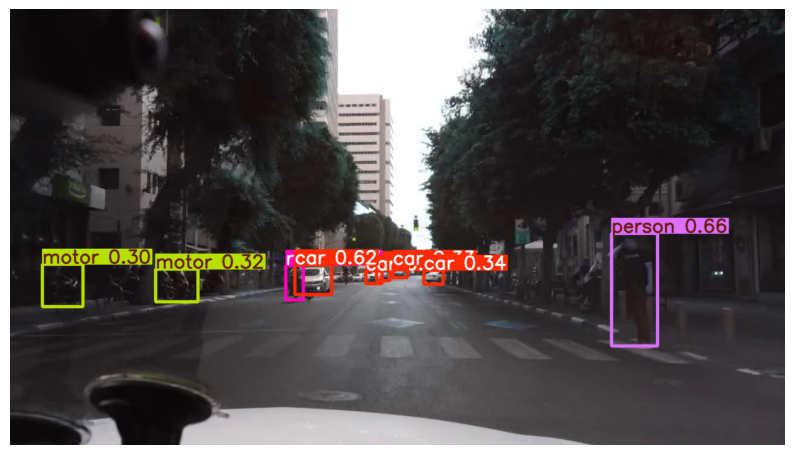

In [12]:
# Load the fine-tuned model
model_14_5 = YOLO(f"{project_path}/model_14_5/weights/best.pt")

# Run inference on a test image
results = model_14_5("dataset1/images/test/dbde2819-2a939dc6.jpg")

mt.display_results(results)


In [26]:

from ultralytics import YOLO

# Load a pre-trained YOLOv8 model
model15 = YOLO("yolov8m.pt")

# Train the model with a learning rate scheduler
model15.train(
    data= dataset1_path,  # Path to your custom dataset.yaml file
    epochs=50,            # Number of training epochs
    imgsz=640,            # Image size (YOLO generally works well with 640 or 1280)
    batch=128,             # Set batch size to control memory usage
    project=project_path, # Directory where training results will be saved
    name="model_15_2", # Folder name for saving the model
    exist_ok=True,        # Overwrite existing run folder
    workers=6,            # Number of data loading workers
    save_period=5,        # Save model every 2 epochs
    verbose=False,        # Suppress verbose output
    freeze=10,            # Freeze the backbone
    lr0=0.02,             # Initial learning rate
    lrf=0.02,              # Final learning rate (used for cosine decay scheduler)
    cos_lr = True,
    patience = 7,
    cls=1.5,
    dropout = 0.3,
    augment = True,
)


Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/yaml_files/dataset1.yaml, epochs=50, time=None, patience=7, batch=128, imgsz=640, save=True, save_period=5, cache=False, device=None, workers=6, project=/content/drive/MyDrive/FinalProjectRuntimeruns/train, name=model_15_2, exist_ok=True, pretrained=True, optimizer=auto, verbose=False, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=10, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.3, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=F

train: Scanning /content/dataset1/labels/train.cache... 69863 images, 137 backgrounds, 0 corrupt: 100%|██████████| 70000/70000 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/dataset1/images/train/75055858-7d04a650.jpg: 1 duplicate labels removed


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/dataset1/labels/val.cache... 10000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 10000/10000 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_15_2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.02' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.001), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 6 dataloader workers
Logging results to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_15_2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      38.9G      1.348      3.385      1.034       3764        640: 100%|██████████| 547/547 [04:42<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.06s/it]


                   all      10000     185526      0.657       0.37      0.413      0.232

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50        36G      1.311      2.519     0.9987       3218        640: 100%|██████████| 547/547 [04:41<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.07s/it]


                   all      10000     185526      0.655      0.396       0.43      0.239

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      40.1G      1.337      2.523      1.012       3524        640: 100%|██████████| 547/547 [04:41<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.07s/it]


                   all      10000     185526      0.676      0.393      0.432      0.235

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      40.2G      1.339      2.481      1.016       3537        640: 100%|██████████| 547/547 [04:41<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.07s/it]


                   all      10000     185526      0.676      0.404      0.445      0.243

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      35.5G      1.317       2.39      1.008       3205        640: 100%|██████████| 547/547 [04:41<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.06s/it]


                   all      10000     185526      0.672      0.412      0.452      0.249

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      36.1G      1.305      2.343      1.003       3301        640: 100%|██████████| 547/547 [04:41<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.06s/it]


                   all      10000     185526      0.681      0.416      0.463      0.255

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      41.3G      1.296      2.307     0.9989       3732        640: 100%|██████████| 547/547 [04:41<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.07s/it]


                   all      10000     185526       0.58      0.428      0.469      0.256

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      40.2G      1.288      2.278     0.9959       3744        640: 100%|██████████| 547/547 [04:41<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.06s/it]


                   all      10000     185526      0.692      0.435      0.478      0.265

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      33.9G      1.282      2.261     0.9936       3676        640: 100%|██████████| 547/547 [04:40<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:43<00:00,  1.08s/it]


                   all      10000     185526      0.693      0.436      0.483      0.267

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      33.5G      1.277      2.238     0.9925       3746        640: 100%|██████████| 547/547 [04:41<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.06s/it]


                   all      10000     185526        0.7      0.431      0.485       0.27

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      38.6G      1.273      2.226     0.9899       3660        640: 100%|██████████| 547/547 [04:41<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.06s/it]


                   all      10000     185526      0.697       0.44      0.487      0.272

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      33.5G      1.271      2.216     0.9886       3542        640: 100%|██████████| 547/547 [04:41<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.06s/it]


                   all      10000     185526      0.702      0.433      0.489      0.273

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      36.8G      1.268      2.203      0.986       3872        640: 100%|██████████| 547/547 [04:41<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.06s/it]


                   all      10000     185526      0.699      0.441      0.491      0.276

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50        40G      1.266      2.194     0.9844       3369        640: 100%|██████████| 547/547 [04:40<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.06s/it]


                   all      10000     185526      0.715       0.44      0.496      0.278

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      33.3G      1.262      2.183     0.9844       3342        640: 100%|██████████| 547/547 [04:41<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.06s/it]


                   all      10000     185526      0.707      0.445      0.499       0.28

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      33.7G       1.26      2.174      0.982       3542        640: 100%|██████████| 547/547 [04:41<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.07s/it]


                   all      10000     185526      0.707      0.447      0.503      0.282

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      35.4G      1.256      2.164     0.9808       3654        640: 100%|██████████| 547/547 [04:41<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.06s/it]


                   all      10000     185526      0.699       0.45      0.503      0.282

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      37.8G      1.253      2.159     0.9794       3416        640: 100%|██████████| 547/547 [04:41<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.06s/it]


                   all      10000     185526      0.707      0.452      0.503      0.284

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      40.6G      1.253      2.149      0.979       3277        640: 100%|██████████| 547/547 [04:40<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:41<00:00,  1.05s/it]


                   all      10000     185526      0.706      0.459      0.513      0.287

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      33.9G      1.251       2.14     0.9772       3216        640: 100%|██████████| 547/547 [04:39<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:41<00:00,  1.04s/it]


                   all      10000     185526      0.709      0.457      0.514       0.29

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      41.8G      1.249      2.134     0.9762       3711        640: 100%|██████████| 547/547 [04:40<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:41<00:00,  1.04s/it]


                   all      10000     185526      0.718      0.458      0.512      0.289

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      34.3G      1.246      2.122      0.975       3800        640: 100%|██████████| 547/547 [04:39<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:41<00:00,  1.04s/it]


                   all      10000     185526      0.716      0.457      0.511       0.29

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      41.2G      1.244      2.118     0.9742       3419        640: 100%|██████████| 547/547 [04:40<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.06s/it]


                   all      10000     185526       0.71      0.462      0.514      0.292

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      40.2G       1.24      2.107     0.9726       3533        640: 100%|██████████| 547/547 [04:40<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:41<00:00,  1.05s/it]


                   all      10000     185526      0.715      0.463      0.515      0.292

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      34.5G      1.239      2.099      0.972       3691        640: 100%|██████████| 547/547 [04:41<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.06s/it]


                   all      10000     185526      0.707      0.463      0.513      0.292

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50        39G      1.236       2.09     0.9717       3572        640: 100%|██████████| 547/547 [04:41<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.05s/it]


                   all      10000     185526      0.706      0.464      0.514      0.293

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      40.1G      1.235      2.085     0.9696       3094        640: 100%|██████████| 547/547 [04:40<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.05s/it]


                   all      10000     185526      0.706      0.464      0.515      0.294

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      36.8G      1.232      2.073     0.9673       3639        640: 100%|██████████| 547/547 [04:41<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.05s/it]


                   all      10000     185526      0.704      0.466      0.517      0.294

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      33.1G      1.232      2.067     0.9677       3666        640: 100%|██████████| 547/547 [04:41<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:41<00:00,  1.05s/it]


                   all      10000     185526      0.712       0.46      0.517      0.294

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      35.8G      1.228      2.057     0.9672       3259        640: 100%|██████████| 547/547 [04:40<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.05s/it]


                   all      10000     185526      0.712      0.463      0.517      0.294

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      33.8G      1.227      2.055     0.9671       3866        640: 100%|██████████| 547/547 [04:41<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:41<00:00,  1.04s/it]


                   all      10000     185526      0.713      0.464      0.517      0.294

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      33.1G      1.223      2.038     0.9644       3597        640: 100%|██████████| 547/547 [04:40<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:41<00:00,  1.05s/it]


                   all      10000     185526       0.71      0.467      0.518      0.294

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      36.7G      1.221      2.034     0.9633       3469        640: 100%|██████████| 547/547 [04:40<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:41<00:00,  1.05s/it]


                   all      10000     185526      0.712      0.467      0.518      0.295

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      33.7G      1.219      2.022     0.9638       3561        640: 100%|██████████| 547/547 [04:39<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:41<00:00,  1.05s/it]


                   all      10000     185526      0.708      0.468      0.518      0.295

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      35.7G      1.218      2.017     0.9637       3822        640: 100%|██████████| 547/547 [04:39<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:41<00:00,  1.04s/it]


                   all      10000     185526      0.703      0.472      0.519      0.295

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      37.3G      1.214      2.005     0.9609       3508        640: 100%|██████████| 547/547 [04:39<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:41<00:00,  1.05s/it]


                   all      10000     185526      0.707       0.47      0.519      0.295

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      40.7G      1.212      1.996     0.9603       3789        640: 100%|██████████| 547/547 [04:40<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:41<00:00,  1.04s/it]


                   all      10000     185526      0.705      0.471      0.519      0.295

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      41.7G       1.21      1.988     0.9593       3842        640: 100%|██████████| 547/547 [04:39<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:41<00:00,  1.05s/it]


                   all      10000     185526      0.706      0.472      0.519      0.295

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      33.4G      1.207      1.978     0.9582       3297        640: 100%|██████████| 547/547 [04:40<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.05s/it]


                   all      10000     185526      0.705      0.472      0.519      0.295

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      40.6G      1.204      1.971     0.9586       3465        640: 100%|██████████| 547/547 [04:40<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:41<00:00,  1.05s/it]


                   all      10000     185526      0.708      0.471       0.52      0.296
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      31.5G      1.259      2.033     0.9697       1905        640: 100%|██████████| 547/547 [04:32<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.06s/it]


                   all      10000     185526      0.708       0.47       0.52      0.295

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50        31G      1.255      2.015     0.9673       2057        640: 100%|██████████| 547/547 [04:29<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.05s/it]


                   all      10000     185526      0.706      0.471      0.519      0.295

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      31.1G      1.253      2.005     0.9664       1976        640: 100%|██████████| 547/547 [04:29<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.05s/it]


                   all      10000     185526      0.709      0.468      0.519      0.295

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      31.1G       1.25      1.994     0.9645       1827        640: 100%|██████████| 547/547 [04:28<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.05s/it]


                   all      10000     185526      0.708      0.468      0.518      0.296

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      31.1G      1.248      1.986     0.9621       2028        640: 100%|██████████| 547/547 [04:28<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.05s/it]


                   all      10000     185526       0.71      0.468      0.518      0.295

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      31.3G      1.246      1.978     0.9611       2003        640: 100%|██████████| 547/547 [04:28<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.06s/it]


                   all      10000     185526      0.711      0.467      0.518      0.295

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50        31G      1.244      1.972     0.9619       2005        640: 100%|██████████| 547/547 [04:29<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:42<00:00,  1.05s/it]


                   all      10000     185526      0.711      0.465      0.518      0.295
EarlyStopping: Training stopped early as no improvement observed in last 7 epochs. Best results observed at epoch 40, best model saved as best.pt.
To update EarlyStopping(patience=7) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

47 epochs completed in 4.238 hours.
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_15_2/weights/last.pt, 52.0MB
Optimizer stripped from /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_15_2/weights/best.pt, 52.0MB

Validating /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_15_2/weights/best.pt...
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,845,550 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [01:23<00:00,  2.08s/it]


                   all      10000     185526      0.705      0.453      0.508      0.293
Speed: 0.1ms preprocess, 2.1ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to /content/drive/MyDrive/FinalProjectRuntimeruns/train/model_15_2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c170d3ec490>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0


image 1/1 /content/dataset1/images/test/dbde2819-2a939dc6.jpg: 384x640 10 cars, 5 motors, 1 bike, 3 persons, 2 traffic lights, 2 traffic signs, 1 rider, 13.9ms
Speed: 1.9ms preprocess, 13.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


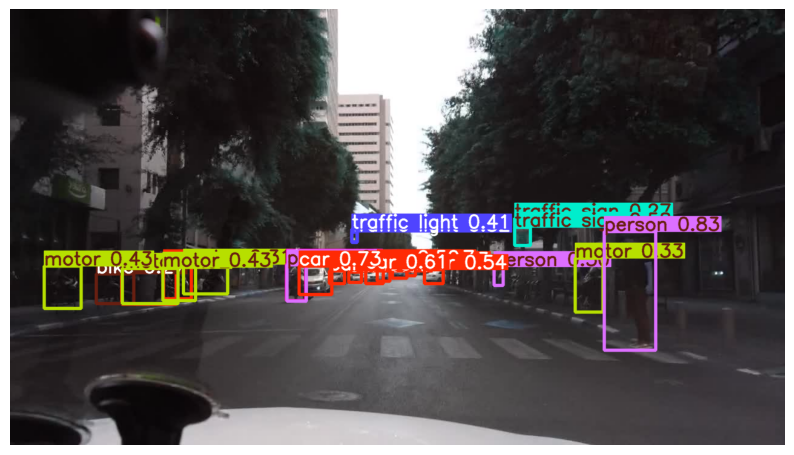

In [27]:
# Load the fine-tuned model
model_152 = YOLO(f"{project_path}/model_15_2/weights/best.pt")

# Run inference on a test image
results = model_152("dataset1/images/test/dbde2819-2a939dc6.jpg")



mt.display_results(results)


In [ ]:

from ultralytics import YOLO

# Load a pre-trained YOLOv8 model
model16 = YOLO(f"{project_path}/model_15_2/weights/best.pt")

# Train the model with a learning rate scheduler
model16.train(
    data= dataset1_path,  # Path to your custom dataset.yaml file
    epochs=100,            # Number of training epochs
    imgsz=640,            # Image size (YOLO generally works well with 640 or 1280)
    batch=128,             # Set batch size to control memory usage
    project=project_path, # Directory where training results will be saved
    name="model_16", # Folder name for saving the model
    exist_ok=True,        # Overwrite existing run folder
    workers=6,            # Number of data loading workers
    save_period=5,        # Save model every 2 epochs
    verbose=False,        # Suppress verbose output
    freeze=10,            # Freeze the backbone
    lr0=0.02,             # Initial learning rate
    lrf=0.02,              # Final learning rate (used for cosine decay scheduler)
    cos_lr = True,
    patience = 7,
    cls=1.5,
    dropout = 0.5,
    augment = True,
    resume= True
)


# 4) Results and Analysis of Models

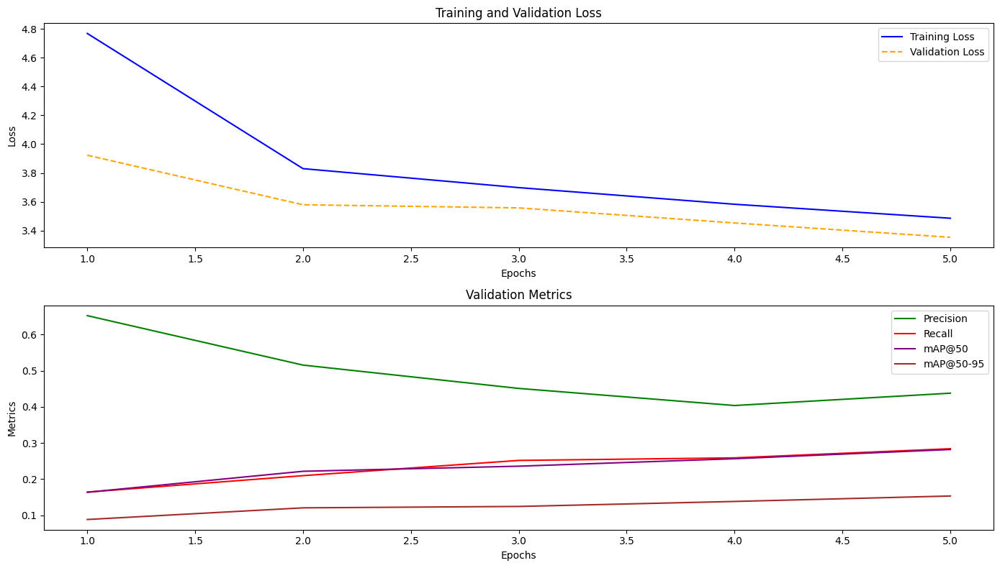

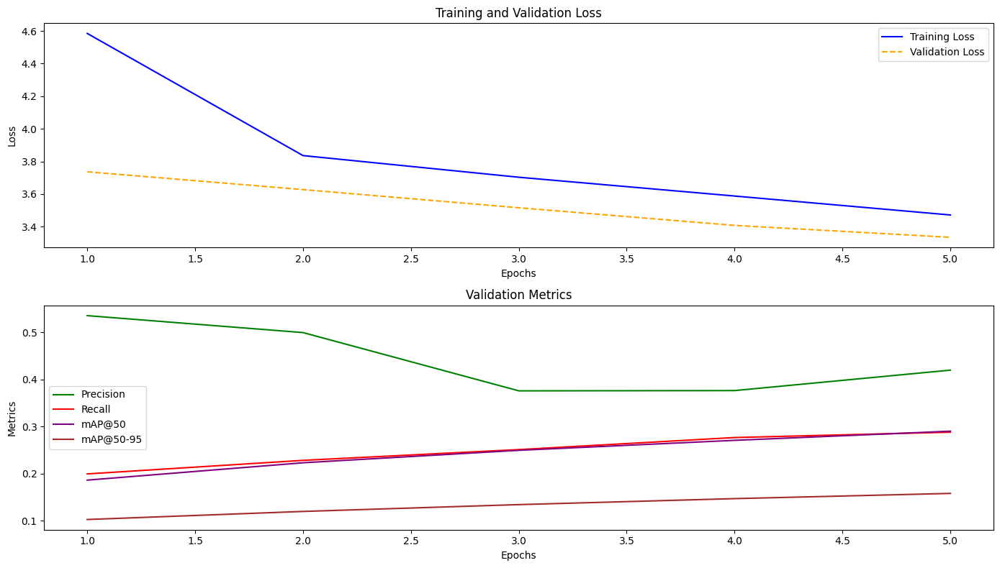

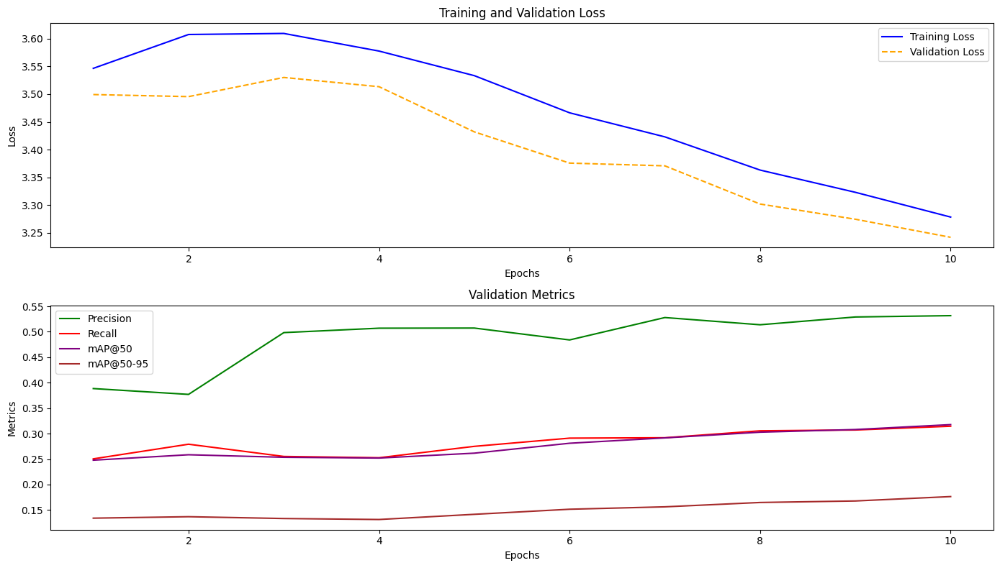

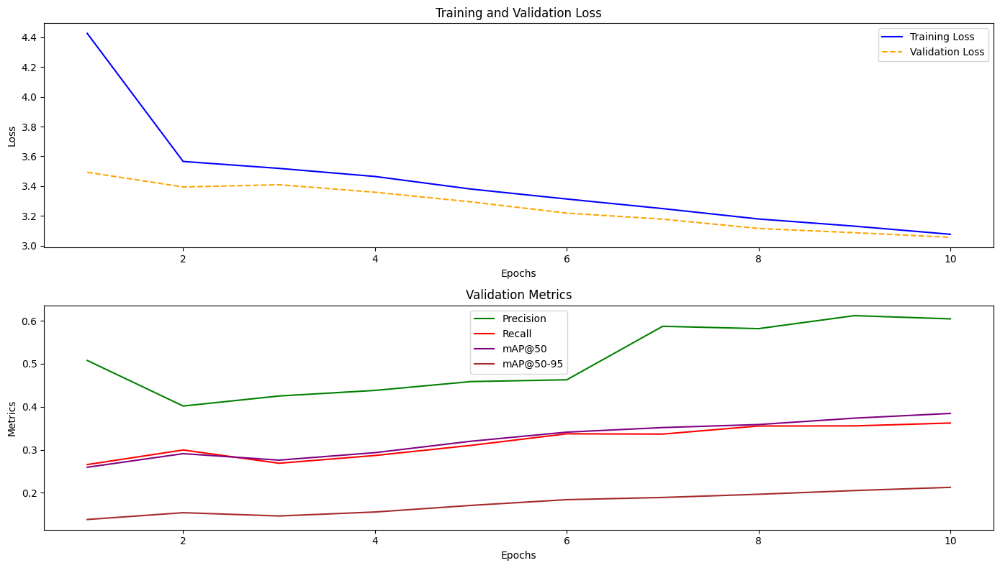

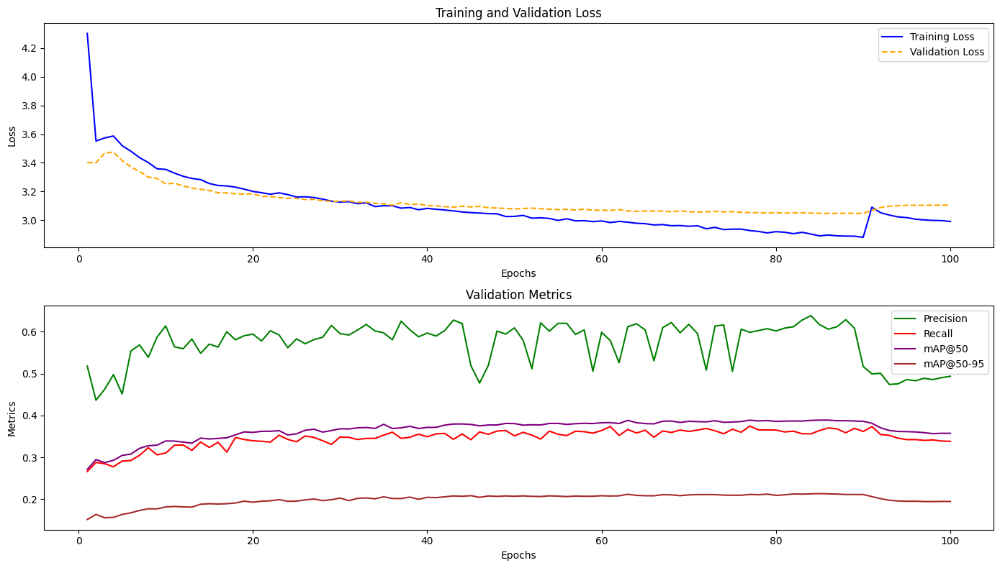

...

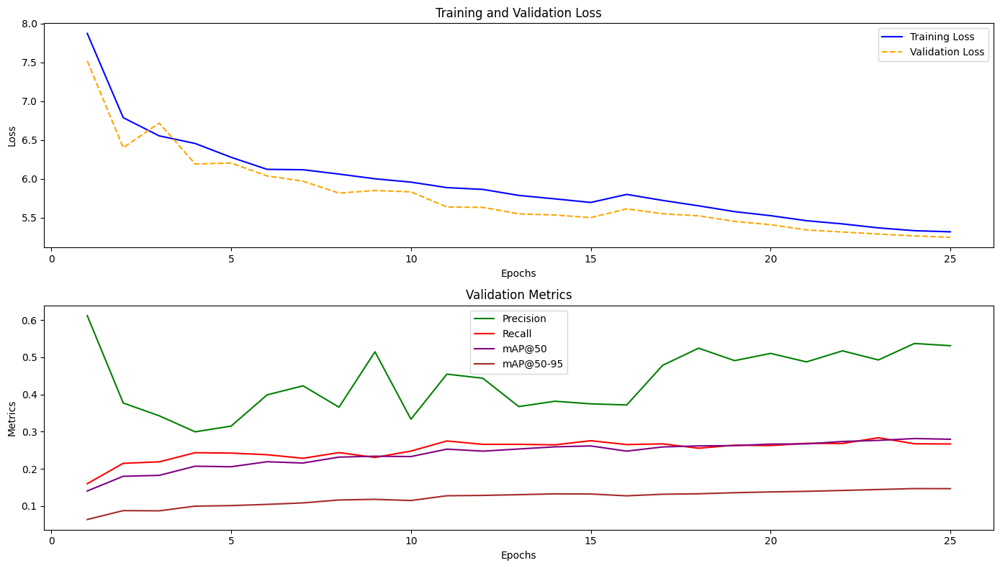

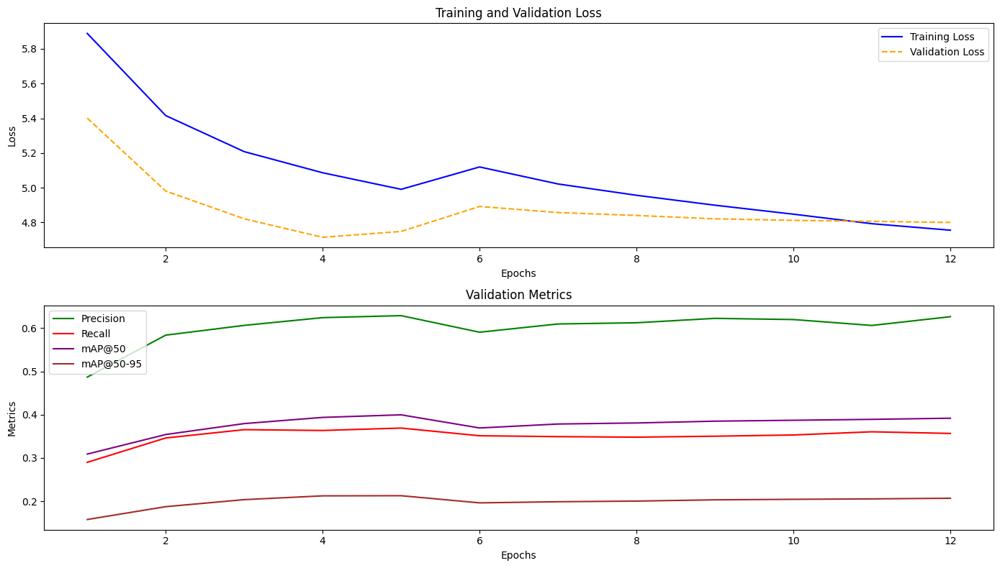

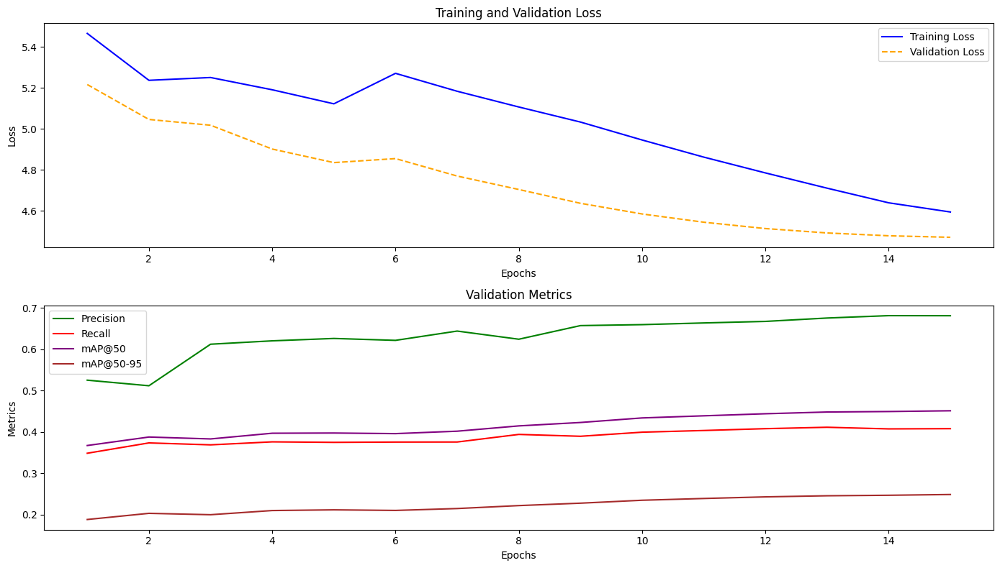

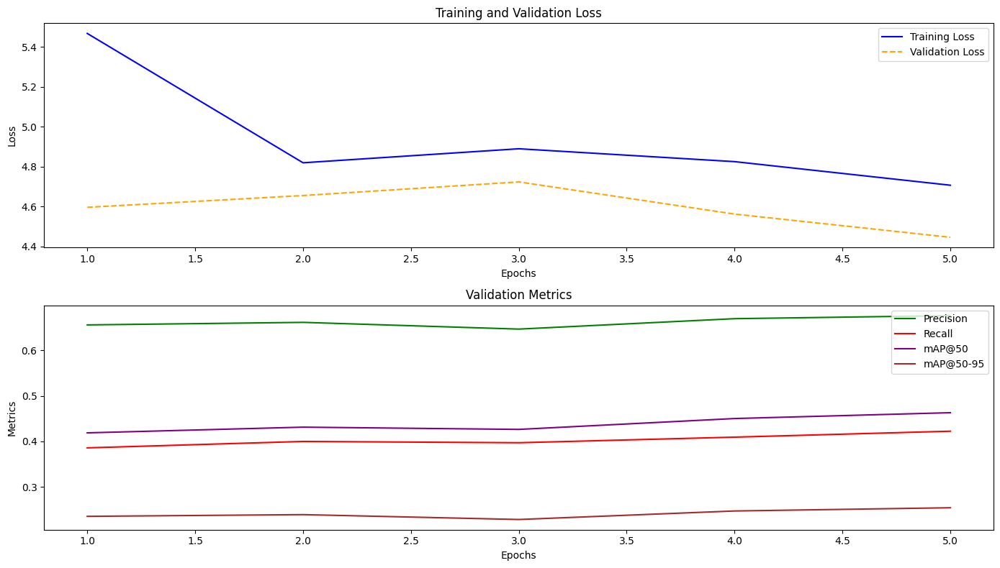

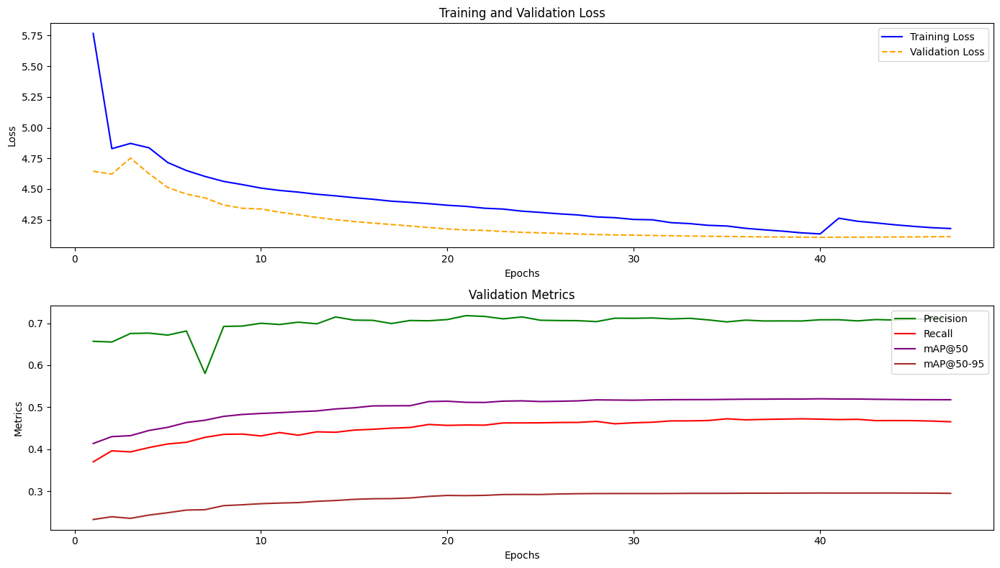

In [30]:
mt.plot_yolo_metrics(f"{project_path}/model_1/results.csv")
mt.plot_yolo_metrics(f"{project_path}/model_2/results.csv")
mt.plot_yolo_metrics(f"{project_path}/model_3/results.csv")
mt.plot_yolo_metrics(f"{project_path}/model_4/results.csv")
mt.plot_yolo_metrics(f"{project_path}/model_5/results.csv")
mt.plot_yolo_metrics(f"{project_path}/model_6/results.csv")
mt.plot_yolo_metrics(f"{project_path}/model_7/results.csv")
mt.plot_yolo_metrics(f"{project_path}/model_8/results.csv")
mt.plot_yolo_metrics(f"{project_path}/model_9/results.csv")
mt.plot_yolo_metrics(f"{project_path}/model_10/results.csv")
mt.plot_yolo_metrics(f"{project_path}/model_11/results.csv")
mt.plot_yolo_metrics(f"{project_path}/model_12/results.csv")
mt.plot_yolo_metrics(f"{project_path}/model_13/results.csv")
mt.plot_yolo_metrics(f"{project_path}/model_14/results.csv")
mt.plot_yolo_metrics(f"{project_path}/model_15/results.csv")
mt.plot_yolo_metrics(f"{project_path}/model_15_2/results.csv")